In [18]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.graph_objects as go
import json, math
import matplotlib.ticker as mticker

import statsmodels.api as sm
from statsmodels.tsa.seasonal import STL, seasonal_decompose
from datetime import timedelta
import keras, os
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import root_mean_squared_log_error, mean_absolute_error
from keras.models import load_model

In [2]:
API_URLS = "/workspaces/Ecommerce-Project/Machine Learning Development/buffer_customer"

class ZeroDataError(Exception):
    pass

def normalize_json_to_df(jsondata):
    with open(jsondata, "r") as f:
        data = json.load(f)  # Load entire JSON
        df = pd.json_normalize(data)  
    return df

def fetch_json_from_api(api_urls):
    main_df = pd.DataFrame()

    try:
        for filename in os.listdir(api_urls):
            if filename.lower().endswith(".json"):
                print(filename)
                final_form = os.path.join(api_urls, filename)
                df_temp = normalize_json_to_df(final_form)
                main_df = pd.concat([main_df, df_temp], ignore_index=True)

        if main_df.shape == (0, 0):
            raise ZeroDataError("Received zero value, cannot continue processing")
        
        print("Fetching success!!!")
        return main_df
    except ZeroDataError as e:
        error_summary = f"{type(e).__name__}: {e}"
        return error_summary
    
df = fetch_json_from_api(API_URLS)
print("Combined dataframe shape:", df.shape)
df


CST230426UYG.json
CST220418QR5.json
CST220301WCO.json
CST230410IM7.json
CST211116OUH.json
Fetching success!!!
Combined dataframe shape: (5585, 8)


,id,customer_name,booking_date,check_in,check_out,ota_name,net_amount_stay,is_confirmed
0,PRB2410070810ZKXS5E,Lanussa Hill Villa,07/10/2024 00:00:00,09/10/2024,12/10/2024,Booking.com,1060896.00,True
1,PRB2410070810ADZ1PE,Lanussa Hill Villa,07/10/2024 00:00:00,10/10/2024,12/10/2024,Traveloka,843752.00,True
2,PRB2410070810RMBJIJ,Lanussa Hill Villa,07/10/2024 00:00:00,12/10/2024,13/10/2024,Traveloka,428111.00,True
3,PRB2411010811ZMTH64,Lanussa Hill Villa,01/11/2024 00:00:00,01/11/2024,03/11/2024,Booking.com,1053184.00,True
4,PRB2411010811DTULRC,Lanussa Hill Villa,01/11/2024 00:00:00,07/11/2024,08/11/2024,Hotel Direct Booking,500000.00,True
...,...,...,...,...,...,...,...,...
5580,PRB2510040510M20JZS,Mount Batur Villa,04/10/2025 00:00:00,04/10/2025,05/10/2025,Tiket.com,556572.44,True
5581,PRB2510040710HKYSSY,Mount Batur Villa,04/10/2025 00:00:00,04/10/2025,05/10/2025,Traveloka,704688.00,True
5582,PRB25100505101CW6IK,Mount Batur Villa,04/10/2025 00:00:00,30/10/2025,31/10/2025,Tiket.com,504856.35,True
5583,PRB2510050510JWFQN1,Mount Batur Villa,04/10/2025 00:00:00,09/11/2025,10/11/2025,Agoda,397431.00,True


In [3]:
def preprocess_df(main_df):
    # main_df['net_amount_stay'] = main_df['net_amount_stay'] / 100
    main_df = main_df.drop(columns='id')
    
    main_df['booking_date'] = pd.to_datetime(main_df['booking_date'], dayfirst=True)
    main_df['check_in'] = pd.to_datetime(main_df['check_in'], dayfirst=True)
    main_df['check_out'] = pd.to_datetime(main_df['check_out'], dayfirst=True)

    main_df['lead_days'] = (main_df['check_in'] - main_df['booking_date']).dt.days

    main_df['booking_day'] = main_df['booking_date'].dt.day
    main_df['booking_month'] = main_df['booking_date'].dt.month
    main_df['booking_year'] = main_df['booking_date'].dt.year

    main_df['check_in_day'] = main_df['check_in'].dt.day
    main_df['check_in_month'] = main_df['check_in'].dt.month
    main_df['check_in_year'] = main_df['check_in'].dt.year
    main_df['check_in_weekday'] = main_df['check_in'].dt.day_name() 

    main_df['check_out_day'] = main_df['check_out'].dt.day
    main_df['check_out_month'] = main_df['check_out'].dt.month
    main_df['check_out_year'] = main_df['check_out'].dt.year

    main_df['stay_days'] = (main_df['check_out'] - main_df['check_in']).dt.days
    main_df['price_per_night'] = main_df['net_amount_stay'] / main_df['stay_days']

    no_net = []
    for i in range(len(main_df['net_amount_stay'])):
      if main_df.iloc[i, 5] == 0:
          no_net.append(0)
      else:
          no_net.append(1)
    main_df['net_amount_avail'] = no_net
    main_df['is_confirmed'] = main_df['is_confirmed'].replace({'t': True, 'f': False})
    main_df = main_df.loc[(main_df['lead_days'] >= 0) & 
                       (main_df['net_amount_avail'] == 1) &
                       (main_df['price_per_night'] <= 18000000) &
                       (main_df['net_amount_stay'] > 0), :]
    return main_df

df = preprocess_df(df)
df

,customer_name,booking_date,check_in,check_out,ota_name,net_amount_stay,is_confirmed,lead_days,booking_day,booking_month,...,check_in_day,check_in_month,check_in_year,check_in_weekday,check_out_day,check_out_month,check_out_year,stay_days,price_per_night,net_amount_avail
0,Lanussa Hill Villa,2024-10-07,2024-10-09,2024-10-12,Booking.com,1060896.00,True,2,7,10,...,9,10,2024,Wednesday,12,10,2024,3,353632.00,1
1,Lanussa Hill Villa,2024-10-07,2024-10-10,2024-10-12,Traveloka,843752.00,True,3,7,10,...,10,10,2024,Thursday,12,10,2024,2,421876.00,1
2,Lanussa Hill Villa,2024-10-07,2024-10-12,2024-10-13,Traveloka,428111.00,True,5,7,10,...,12,10,2024,Saturday,13,10,2024,1,428111.00,1
3,Lanussa Hill Villa,2024-11-01,2024-11-01,2024-11-03,Booking.com,1053184.00,True,0,1,11,...,1,11,2024,Friday,3,11,2024,2,526592.00,1
4,Lanussa Hill Villa,2024-11-01,2024-11-07,2024-11-08,Hotel Direct Booking,500000.00,True,6,1,11,...,7,11,2024,Thursday,8,11,2024,1,500000.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5580,Mount Batur Villa,2025-10-04,2025-10-04,2025-10-05,Tiket.com,556572.44,True,0,4,10,...,4,10,2025,Saturday,5,10,2025,1,556572.44,1
5581,Mount Batur Villa,2025-10-04,2025-10-04,2025-10-05,Traveloka,704688.00,True,0,4,10,...,4,10,2025,Saturday,5,10,2025,1,704688.00,1
5582,Mount Batur Villa,2025-10-04,2025-10-30,2025-10-31,Tiket.com,504856.35,True,26,4,10,...,30,10,2025,Thursday,31,10,2025,1,504856.35,1
5583,Mount Batur Villa,2025-10-04,2025-11-09,2025-11-10,Agoda,397431.00,True,36,4,10,...,9,11,2025,Sunday,10,11,2025,1,397431.00,1


In [7]:
test = {
  "sumbu_y_mean_prediksi": [
    467428.03125,
    451417.1875,
    453023.15625,
    383019.5625,
    348920.25
  ],
  "sumbu_y_max_prediksi": [
    451950.84375,
    541357.1875,
    512668.9375,
    482520.1875,
    495746.78125
  ],
  "sumbu_y_min_prediksi": [
    484570.8125,
    497894.71875,
    486060.0625,
    512795.4375,
    494108.5625
  ],
  "sumbu_y_mean_sebelumnya": [
    1902045.100001755,
    1732995.4999986417,
    1394896.300000296,
    887747.4999999428,
    723524.1241714646,
    612981.3850157314,
    466260.99999991874,
    840416.4912513137,
    716710.064334365,
    625119.415110717,
    629476.8358457175,
    528665.0705187956,
    440137.4701191433,
    341986.6239889645,
    387161.9458305296,
    431020.7649735825,
    480597.98894513556,
    696094.4944611075,
    761517.8399895077,
    688690.5709037744,
    641266.6581131329,
    384966.3897872074,
    491303.2150590895,
    724690.8599289315,
    893512.6130814622,
    1510437.4963848277,
    2015547.4116872088,
    2034859.6778058582,
    1074492.8075079534,
    667895.3896986875,
    424934.09159326914,
    414294.6761455677,
    534095.0167180747,
    900674.0856151766,
    347070.4008273287,
    525855.5411223036,
    595373.7888139886,
    642782.5851149231,
    713962.6843293009,
    975204.3740720432,
    753500.0000003244,
    730319.7279203001,
    632206.4698536748,
    595120.8605611516,
    601812.687639226,
    613021.8152486621,
    573602.294700535,
    312955.15745937015,
    236893.62208911244,
    336515.38803962385,
    438861.4911244314,
    453473.5178288236,
    403651.65357722173,
    387303.75879128923,
    385231.82289690064,
    724672.6347729923,
    686360.216277502,
    673633.3930058249,
    654888.4082440044,
    633711.8891078938,
    614238.0640543374,
    647353.972038179,
    541594.0602610199,
    547120.3343136476,
    608258.365470468,
    517178.2095777095,
    415392.71191993204,
    572690.9157114538,
    584352.1376556813,
    424859.8639354909,
    442744.12216894934,
    483066.57118955825,
    514969.92923038546,
    594104.0102796578,
    587759.6533285246,
    718165.2886685937,
    821255.0281972678,
    820850.0363805903,
    730618.2812045345,
    706221.442607028,
    671298.4209315183,
    713158.0617055702,
    716367.3915265348,
    693152.9276561019,
    663190.1107870999,
    921970.22408212,
    783243.2926028462,
    632084.8851624042,
    544728.7944400242,
    415117.3028684332,
    617303.2610694963,
    797541.7990774551,
    882930.3374784483,
    646055.971077383,
    563558.0865996208,
    466530.6719170172,
    567735.5116628973,
    579343.3156933363,
    576450.2969020269,
    602861.6127997884,
    674103.4124198077,
    736980.085527736,
    672110.3742084929,
    566984.2166161982,
    472664.9944849745,
    522174.81192084245,
    688725.500883059,
    762716.4469387225,
    606317.560170667,
    908173.8202091701,
    691144.9239279078,
    612144.7051135015,
    607247.278274061,
    685305.5664738386,
    679208.7142519201,
    722341.1289432488,
    884698.4424445006,
    1096312.6476935348,
    652783.2786187497,
    504453.7059539511,
    648864.0517163998,
    648778.840816139,
    649478.8781394983,
    648273.5507832908,
    586908.5207179036,
    555915.8046603358,
    567872.8992128129,
    569184.2299434325,
    585121.5756512673,
    578552.8721358376,
    505304.5285552481,
    373802.4383159054,
    338135.62599361024,
    398834.4680900778,
    396818.92926969676,
    321168.1482752517,
    329966.0734155939,
    345985.99417585036,
    310537.3750824463,
    336424.40896478517,
    415339.9053857075,
    525087.6374177359,
    538921.767491541,
    525455.769571161,
    472113.8728444038,
    465783.07497257093,
    479705.51805117266,
    481968.7049618448,
    423620.04840814613,
    347604.7639163,
    368460.44026997604,
    426047.9977968014
  ],
  "sumbu_x": [
    "2024-10-08",
    "2024-10-09",
    "2024-10-11",
    "2024-10-14",
    "2024-10-20",
    "2024-10-22",
    "2024-10-23",
    "2024-11-01",
    "2024-11-02",
    "2024-11-03",
    "2024-11-08",
    "2024-11-09",
    "2024-11-10",
    "2024-11-12",
    "2024-11-13",
    "2024-11-15",
    "2024-11-16",
    "2024-11-19",
    "2024-11-21",
    "2024-11-23",
    "2024-11-24",
    "2024-12-05",
    "2024-12-06",
    "2024-12-08",
    "2024-12-09",
    "2024-12-12",
    "2024-12-28",
    "2024-12-29",
    "2025-01-17",
    "2025-01-25",
    "2025-01-31",
    "2025-02-07",
    "2025-02-15",
    "2025-03-02",
    "2025-03-10",
    "2025-03-12",
    "2025-03-13",
    "2025-03-14",
    "2025-03-15",
    "2025-03-19",
    "2025-03-21",
    "2025-03-24",
    "2025-03-27",
    "2025-04-01",
    "2025-04-03",
    "2025-04-04",
    "2025-04-05",
    "2025-04-07",
    "2025-04-08",
    "2025-04-10",
    "2025-04-11",
    "2025-04-12",
    "2025-04-15",
    "2025-04-16",
    "2025-04-17",
    "2025-04-22",
    "2025-04-23",
    "2025-04-24",
    "2025-04-26",
    "2025-04-29",
    "2025-05-01",
    "2025-05-03",
    "2025-05-05",
    "2025-05-06",
    "2025-05-07",
    "2025-05-08",
    "2025-05-09",
    "2025-05-13",
    "2025-05-16",
    "2025-05-20",
    "2025-05-21",
    "2025-05-23",
    "2025-05-25",
    "2025-05-30",
    "2025-05-31",
    "2025-06-02",
    "2025-06-06",
    "2025-06-08",
    "2025-06-12",
    "2025-06-14",
    "2025-06-15",
    "2025-06-17",
    "2025-06-18",
    "2025-06-19",
    "2025-06-20",
    "2025-06-24",
    "2025-06-25",
    "2025-06-26",
    "2025-06-27",
    "2025-06-29",
    "2025-07-04",
    "2025-07-07",
    "2025-07-08",
    "2025-07-10",
    "2025-07-11",
    "2025-07-14",
    "2025-07-15",
    "2025-07-16",
    "2025-07-17",
    "2025-07-18",
    "2025-07-19",
    "2025-07-21",
    "2025-07-22",
    "2025-07-24",
    "2025-07-26",
    "2025-07-28",
    "2025-07-30",
    "2025-07-31",
    "2025-08-01",
    "2025-08-02",
    "2025-08-03",
    "2025-08-05",
    "2025-08-06",
    "2025-08-08",
    "2025-08-09",
    "2025-08-10",
    "2025-08-11",
    "2025-08-12",
    "2025-08-15",
    "2025-08-17",
    "2025-08-22",
    "2025-08-23",
    "2025-08-24",
    "2025-08-25",
    "2025-08-27",
    "2025-08-28",
    "2025-08-30",
    "2025-08-31",
    "2025-09-01",
    "2025-09-02",
    "2025-09-03",
    "2025-09-04",
    "2025-09-05",
    "2025-09-06",
    "2025-09-07",
    "2025-09-09",
    "2025-09-10",
    "2025-09-12",
    "2025-09-13",
    "2025-09-15",
    "2025-09-17",
    "2025-09-20",
    "2025-09-21",
    "2025-09-25",
    "2025-09-26",
    "2025-09-27",
    "2025-09-29",
    "2025-09-30",
    "2025-10-01",
    "2025-10-03",
    "2025-10-04",
    "2025-10-05",
    "2025-10-06",
    "2025-10-07",
    "2025-10-08",
    "2025-10-09",
    "2025-10-10",
    "2025-10-11"
  ]
}

In [4]:
res_training = {
  "Lanussa Hill Villa": {
    "upper_lim": [
      467030.5013588128,
      457045.1576088128,
      444893.3763588128,
      439055.1576088128,
      458205.4388588128,
      477292.8451088128,
      486504.8763588128,
      476423.6888588128,
      474388.1263588128,
      477555.8451088128,
      470447.7513588128,
      464283.3763588128,
      462808.3451088128,
      470888.8451088128,
      478353.9388588128,
      481329.3451088128,
      494757.0013588128,
      490629.7826088128,
      485483.5951088128,
      482221.6888588128,
      479924.0951088128,
      481746.5013588128,
      489128.2513588128,
      497916.9388588128,
      494808.5326088128,
      496475.7513588128,
      513930.6888588128,
      512247.0013588128,
      511487.1263588128,
      507991.1888588128,
      500209.6888588128,
      486893.7513588128,
      478100.7826088128,
      466941.5951088128,
      445704.0013588128,
      484637.7826088128,
      478024.5013588128,
      475432.2826088128,
      457748.7513588128,
      440311.7826088128,
      437716.5326088128,
      418021.5013588128,
      518521.5951088128,
      566166.0326088128,
      534933.2513588128,
      509503.1888588128,
      477593.1888588128,
      455841.2513588128,
      447023.5013588128
    ],
    "lower_lim": [
      376757.1236411872,
      366771.7798911872,
      354619.9986411872,
      348781.7798911872,
      367932.0611411872,
      387019.4673911872,
      396231.4986411872,
      386150.3111411872,
      384114.7486411872,
      387282.4673911872,
      380174.3736411872,
      374009.9986411872,
      372534.9673911872,
      380615.4673911872,
      388080.5611411872,
      391055.9673911872,
      404483.6236411872,
      400356.4048911872,
      395210.2173911872,
      391948.3111411872,
      389650.7173911872,
      391473.1236411872,
      398854.8736411872,
      407643.5611411872,
      404535.1548911872,
      406202.3736411872,
      423657.3111411872,
      421973.6236411872,
      421213.7486411872,
      417717.8111411872,
      409936.3111411872,
      396620.3736411872,
      387827.4048911872,
      376668.2173911872,
      355430.6236411872,
      394364.4048911872,
      387751.1236411872,
      385158.9048911872,
      367475.3736411872,
      350038.4048911872,
      347443.1548911872,
      327748.1236411872,
      428248.2173911872,
      475892.6548911872,
      444659.8736411872,
      419229.8111411872,
      387319.8111411872,
      365567.8736411872,
      356750.1236411872
    ],
    "baseline_pred": [
      421893.8125,
      411908.46875,
      399756.6875,
      393918.46875,
      413068.75,
      432156.15625,
      441368.1875,
      431287,
      429251.4375,
      432419.15625,
      425311.0625,
      419146.6875,
      417671.65625,
      425752.15625,
      433217.25,
      436192.65625,
      449620.3125,
      445493.09375,
      440346.90625,
      437085,
      434787.40625,
      436609.8125,
      443991.5625,
      452780.25,
      449671.84375,
      451339.0625,
      468794,
      467110.3125,
      466350.4375,
      462854.5,
      455073,
      441757.0625,
      432964.09375,
      421804.90625,
      400567.3125,
      439501.09375,
      432887.8125,
      430295.59375,
      412612.0625,
      395175.09375,
      392579.84375,
      372884.8125,
      473384.90625,
      521029.34375,
      489796.5625,
      464366.5,
      432456.5,
      410704.5625,
      401886.8125
    ],
    "max_pred": [
      492162.90625,
      492382.40625,
      492547.5625,
      504541.40625,
      513487.65625,
      518831.59375,
      514831.6875,
      505873.8125,
      497059,
      484287,
      474774.5625,
      468399.90625,
      469162.59375,
      480099.40625,
      489604.5,
      496595.5,
      521031.9375,
      521641.75,
      516852.5,
      512734.59375,
      496111.6875,
      489355.25,
      488072.3125,
      488804.4375,
      478482.65625,
      444515.90625,
      474609.40625,
      485942.0625,
      494394.0625,
      492496.8125,
      480954.25,
      462296.8125,
      455131.1875,
      435381.4375,
      422788.3125,
      451147.5,
      446687.84375,
      439153.34375,
      418789.3125,
      398610.375,
      401844.09375,
      386886.65625,
      498732.1875,
      582627.625,
      523100.15625,
      474061,
      429167.84375,
      432311.9375,
      427668.5
    ],
    "min_pred": [
      398636.96875,
      396160.9375,
      388425.84375,
      378578.1875,
      382579.59375,
      390502.8125,
      391919.84375,
      382563.1875,
      379635.75,
      385343.4375,
      389074.0625,
      392397.5,
      394223.3125,
      395957.0625,
      397594.25,
      398330.65625,
      402744.6875,
      407262.125,
      412978.0625,
      413087.6875,
      411323.8125,
      416112.09375,
      424984.4375,
      431885.6875,
      427168.6875,
      429393.1875,
      447202.8125,
      441995.1875,
      438379.59375,
      432455.34375,
      434126.34375,
      423601.84375,
      422754.4375,
      412545.875,
      417105.5625,
      418594.4375,
      414701.1875,
      408508.59375,
      398718.5625,
      379850.46875,
      378384.90625,
      353748.4375,
      457439.65625,
      498675.5625,
      486771.75,
      475753.40625,
      421979.8125,
      388732.40625,
      378746.84375
    ],
    "x_axis": [
      "2025-09-14",
      "2025-09-16",
      "2025-09-17",
      "2025-09-18",
      "2025-09-19",
      "2025-09-20",
      "2025-09-21",
      "2025-09-22",
      "2025-09-23",
      "2025-09-24",
      "2025-09-25",
      "2025-09-27",
      "2025-09-28",
      "2025-09-29",
      "2025-09-30",
      "2025-10-01",
      "2025-10-02",
      "2025-10-03",
      "2025-10-04",
      "2025-10-05",
      "2025-10-08",
      "2025-10-10",
      "2025-10-11",
      "2025-10-12",
      "2025-10-13",
      "2025-10-14",
      "2025-10-15",
      "2025-10-18",
      "2025-10-21",
      "2025-10-23",
      "2025-10-25",
      "2025-10-26",
      "2025-10-27",
      "2025-10-28",
      "2025-10-30",
      "2025-10-31",
      "2025-11-02",
      "2025-11-05",
      "2025-11-13",
      "2025-11-23",
      "2025-12-12",
      "2025-12-28",
      "2026-01-04",
      "2026-01-14",
      "2026-03-17",
      "2026-04-20",
      "2026-06-02",
      "2026-06-09",
      "2026-09-14"
    ],
    "real_data": [
      417163.8537156431,
      416826.1878203191,
      419195.78325094853,
      424034.3091144067,
      428944.67017146957,
      431258.67290618253,
      430573.3664326638,
      428844.2393384171,
      426800.2967493617,
      424724.77702765306,
      424356.2964926677,
      427303.4498697018,
      431697.47326740884,
      435798.32058455684,
      439066.61113064486,
      441111.07868561166,
      440870.13480893744,
      440296.7500591371,
      440621.71876396367,
      441302.26362374536,
      443201.8676515191,
      447902.75893983385,
      453381.5816752211,
      459064.6558665185,
      465522.8017750806,
      470941.7906841541,
      471478.60703868384,
      468535.75343004364,
      461974.4963960202,
      450718.1522641219,
      441647.99525688,
      434765.1242009943,
      430014.8478216383,
      425957.698317697,
      422644.1681869854,
      416046.1448035956,
      406250.43534976355,
      402696.1158218575,
      411229.9685680446,
      429222.193725153,
      447513.32333028724,
      464218.08442148345,
      472935.82868921466,
      467995.94948929065,
      448867.3121467823,
      430382.7380747957,
      414690.2411130359,
      400572.3229620826,
      386309.28192840196
    ],
    "real_max": [
      497020.9757573834,
      499982.70785870275,
      502999.981084759,
      504094.587618608,
      501954.1829880014,
      496508.4034934829,
      488887.1903918867,
      480933.6422984041,
      474732.4103102804,
      471817.38937353145,
      472505.45230338926,
      478360.7921344203,
      486876.8627976902,
      495573.10556500853,
      503375.8551756845,
      507820.477905347,
      507248.32849881536,
      503764.12614368356,
      498722.47134454537,
      491918.3545607755,
      482768.8761719076,
      476623.8840964848,
      472605.8135095964,
      470422.7626388129,
      470596.73461741547,
      474721.0597889201,
      475520.93112461007,
      473589.0896328132,
      467170.8719835238,
      456601.3286208729,
      447321.44388806185,
      439651.9779744766,
      433354.3383518447,
      428833.0855435106,
      424727.7596502036,
      418200.7291773505,
      408932.05837839656,
      407949.4735666468,
      419008.87183009787,
      434539.3403733582,
      451083.0432746348,
      465311.5376172432,
      469623.4090501354,
      460517.2433274944,
      442905.121612235,
      425409.3558718626,
      411200.12416030647,
      398649.18051619234,
      385819.5472044886
    ],
    "real_min": [
      388082.1251228856,
      386564.3882465343,
      384758.84831307165,
      383858.49939789873,
      383485.21888740745,
      383069.65437200916,
      383085.11137558514,
      384450.74441574386,
      386685.8026405851,
      389009.95426208794,
      391372.2646122917,
      393956.9064112027,
      396775.3807410338,
      400033.83210336213,
      403391.68943416845,
      406699.2541343016,
      410213.0650041125,
      414313.8965427532,
      418895.7525342002,
      423309.99625861086,
      428544.625769243,
      436349.0259341042,
      444355.8067632868,
      452467.1464236116,
      461803.35961531464,
      472222.7497768632,
      478925.59886731516,
      484255.2013194241,
      486090.10836170695,
      485137.65709609276,
      480954.6351206678,
      474808.85285768687,
      466000.53411068005,
      456152.1785039019,
      443074.6915823872,
      428972.1755871944,
      413062.2809099839,
      405405.89750839735,
      410895.32679754996,
      435110.76788377744,
      456041.0976938214,
      477652.73735834926,
      492070.1287301111,
      492298.50022487796,
      467731.71841181844,
      446987.71131403215,
      426960.82743595296,
      407976.03639423556,
      388568.3890228972
    ],
    "rmsle_mean": 0.061243841396309895,
    "mae_mean": 17378.05979799777,
    "rmsle_min": 0.08387206210115702,
    "mae_min": 23725.316885964596,
    "rmsle_max": 0.07542233541177537,
    "mae_max": 25682.751433922032
  },
  "Victory Munggu": {
    "upper_lim": [
      378016.7885181368,
      370591.6322681368,
      374691.1010181368,
      376838.1322681368,
      366312.1322681368,
      344395.6947681368,
      344578.6322681368,
      348748.6010181368,
      344926.6322681368,
      340403.9135181368,
      337140.0697681368,
      339904.7260181368,
      341420.7885181368,
      335715.1010181368,
      328680.4447681368,
      326879.8197681368,
      326378.4135181368,
      326038.8197681368,
      326966.4760181368,
      333811.6947681368,
      340483.0697681368,
      347022.1635181368,
      351804.3510181368,
      357221.9760181368,
      370085.5697681368,
      368986.8197681368,
      359831.4447681368,
      344158.4447681368,
      325734.1635181368,
      322767.6947681368,
      323884.2885181368,
      316466.8822681368,
      320755.4447681368,
      324066.4760181368,
      320564.7885181368,
      314898.5697681368,
      320784.8822681368,
      326089.3197681368,
      317350.5697681368,
      320041.0697681368,
      324106.6010181368,
      329835.8197681368,
      329791.3197681368,
      323433.3510181368,
      320403.7885181368
    ],
    "lower_lim": [
      327044.5239818632,
      319619.3677318632,
      323718.8364818632,
      325865.8677318632,
      315339.8677318632,
      293423.4302318632,
      293606.3677318632,
      297776.3364818632,
      293954.3677318632,
      289431.6489818632,
      286167.8052318632,
      288932.4614818632,
      290448.5239818632,
      284742.8364818632,
      277708.1802318632,
      275907.5552318632,
      275406.1489818632,
      275066.5552318632,
      275994.2114818632,
      282839.4302318632,
      289510.8052318632,
      296049.8989818632,
      300832.0864818632,
      306249.7114818632,
      319113.3052318632,
      318014.5552318632,
      308859.1802318632,
      293186.1802318632,
      274761.8989818632,
      271795.4302318632,
      272912.0239818632,
      265494.6177318632,
      269783.1802318632,
      273094.2114818632,
      269592.5239818632,
      263926.3052318632,
      269812.6177318632,
      275117.0552318632,
      266378.3052318632,
      269068.8052318632,
      273134.3364818632,
      278863.5552318632,
      278819.0552318632,
      272461.0864818632,
      269431.5239818632
    ],
    "baseline_pred": [
      352530.65625,
      345105.5,
      349204.96875,
      351352,
      340826,
      318909.5625,
      319092.5,
      323262.46875,
      319440.5,
      314917.78125,
      311653.9375,
      314418.59375,
      315934.65625,
      310228.96875,
      303194.3125,
      301393.6875,
      300892.28125,
      300552.6875,
      301480.34375,
      308325.5625,
      314996.9375,
      321536.03125,
      326318.21875,
      331735.84375,
      344599.4375,
      343500.6875,
      334345.3125,
      318672.3125,
      300248.03125,
      297281.5625,
      298398.15625,
      290980.75,
      295269.3125,
      298580.34375,
      295078.65625,
      289412.4375,
      295298.75,
      300603.1875,
      291864.4375,
      294554.9375,
      298620.46875,
      304349.6875,
      304305.1875,
      297947.21875,
      294917.65625
    ],
    "max_pred": [
      352449.5,
      349400.15625,
      353491.5,
      360313.8125,
      359502.90625,
      344410,
      348325.40625,
      357276.90625,
      355337.1875,
      347540.1875,
      342924.6875,
      346197.8125,
      346525,
      338038.03125,
      330666.3125,
      330686.96875,
      330233.6875,
      326453.25,
      324301.8125,
      327059.34375,
      328066.375,
      329393.8125,
      330278.1875,
      330992.6875,
      336871.25,
      339753.78125,
      340723.625,
      340139.65625,
      330913.59375,
      327294.8125,
      327883.96875,
      316504.15625,
      320667.65625,
      324731.9375,
      321290.5,
      314810.90625,
      315132.8125,
      312400.4375,
      302860.40625,
      304035.1875,
      306033.1875,
      314359.8125,
      316358.625,
      311337.09375,
      310263.6875
    ],
    "min_pred": [
      341341.4375,
      326794.75,
      336918.25,
      345605,
      337607.40625,
      312419.9375,
      306599.53125,
      307470.96875,
      302768.5,
      296680.84375,
      291993.1875,
      291471.3125,
      293672.5,
      292977.6875,
      287762.40625,
      285060.21875,
      286270.9375,
      291701.28125,
      296666.375,
      303889.28125,
      307525.3125,
      313714.4375,
      325076,
      336421.90625,
      352974.4375,
      338773.34375,
      312292.8125,
      291418.34375,
      284820.4375,
      287470.125,
      286675.4375,
      285412.5625,
      286868.09375,
      283101.875,
      276883.90625,
      272597.9375,
      296005.59375,
      301841.59375,
      292965.53125,
      294891.65625,
      303389.09375,
      301291.5625,
      294714.15625,
      289642.4375,
      287279.8125
    ],
    "x_axis": [
      "2025-09-09",
      "2025-09-10",
      "2025-09-11",
      "2025-09-12",
      "2025-09-13",
      "2025-09-14",
      "2025-09-15",
      "2025-09-16",
      "2025-09-17",
      "2025-09-18",
      "2025-09-19",
      "2025-09-20",
      "2025-09-21",
      "2025-09-22",
      "2025-09-23",
      "2025-09-24",
      "2025-09-25",
      "2025-09-26",
      "2025-09-27",
      "2025-09-29",
      "2025-09-30",
      "2025-10-01",
      "2025-10-03",
      "2025-10-05",
      "2025-10-06",
      "2025-10-07",
      "2025-10-11",
      "2025-10-13",
      "2025-10-14",
      "2025-10-15",
      "2025-10-16",
      "2025-10-21",
      "2025-10-25",
      "2025-10-26",
      "2025-11-11",
      "2026-01-04",
      "2026-01-07",
      "2026-01-15",
      "2026-01-16",
      "2026-02-15",
      "2026-03-25",
      "2026-04-18",
      "2026-04-23",
      "2026-06-01",
      "2026-09-11"
    ],
    "real_data": [
      346372.93440364493,
      343404.225131072,
      340077.25409194274,
      336061.48649624654,
      331976.09990826604,
      329337.30977203173,
      327114.9123077875,
      325243.6792952218,
      323416.1409367319,
      321152.39649260987,
      318720.2069920584,
      315468.1296105298,
      311714.81221631856,
      308417.8209113227,
      306967.50582107715,
      307236.0856080909,
      309405.1644078201,
      313034.9566918577,
      317686.7865555427,
      322730.26299454516,
      326986.05968462443,
      329858.10190311365,
      330755.0862365019,
      328779.42196433095,
      324202.0342461866,
      318140.3760505993,
      309416.04173028475,
      300401.1765039269,
      292521.0724182685,
      285483.73229494866,
      279672.605110294,
      279997.252446373,
      283806.69737350324,
      287566.2815679641,
      291160.96922639303,
      290896.88131665357,
      287560.4795920362,
      282666.64509795903,
      278783.04089027864,
      276355.1343686693,
      277930.79573800816,
      279804.56258407613,
      282665.98086549575,
      296433.17790191324,
      326215.2846429949
    ],
    "real_max": [
      356210.6723674174,
      353700.58377885213,
      351742.84566320234,
      349576.719142133,
      347237.53057198605,
      346153.1796023647,
      345180.8392158418,
      343818.9666590979,
      341543.0708366578,
      338479.1132350854,
      335214.25821033155,
      330984.75934764184,
      325873.06047406944,
      321095.0648638088,
      317933.53169586847,
      316005.8308210979,
      315827.99928911414,
      317491.9728105057,
      320587.4352113,
      324730.79715907015,
      329155.3129893777,
      333168.80709442456,
      336397.8879405864,
      337351.9055435233,
      335647.3149619134,
      331879.3280744191,
      323128.1568234479,
      312343.8549417303,
      301776.086725969,
      291775.96530432196,
      282924.1370703493,
      281712.50138801953,
      284608.7203592713,
      287953.90266839316,
      291355.34291089536,
      290990.749036688,
      287629.9932602255,
      282741.2438920445,
      278847.4141661008,
      276495.47415868245,
      278435.27539813425,
      280935.7190881184,
      285078.8717530459,
      322619.9333715968,
      423588.1544813424
    ],
    "real_min": [
      333259.22324323753,
      329788.7115606436,
      325638.8126056609,
      320607.0733483833,
      315242.9549897547,
      310895.7823709747,
      306627.39654728334,
      302958.90764652146,
      300075.49969205086,
      297611.3320900551,
      295617.1123198039,
      293967.7809499663,
      292827.87390901643,
      292389.1765677101,
      293299.0776863952,
      295212.31365280406,
      298131.31391253683,
      301903.84329312074,
      306437.0569386844,
      311848.0891818546,
      316773.3873297981,
      320121.3825211983,
      320236.315277192,
      316444.0415475473,
      309539.09284288844,
      300873.4549521249,
      290028.73581316223,
      280717.6017607922,
      273714.08217627543,
      268181.80660521594,
      264737.96836605715,
      268740.446892728,
      276188.3054411053,
      282880.99811179267,
      289211.5073862825,
      290806.5101452448,
      287981.50414173666,
      282804.3047333298,
      278866.69404770236,
      276056.3369701448,
      277212.71952673694,
      278226.9426734682,
      279271.7123613496,
      284863.1570145971,
      296609.72501027427
    ],
    "rmsle_mean": 0.04975610839715457,
    "mae_mean": 12179.946588193434,
    "rmsle_min": 0.055084879910837325,
    "mae_min": 12910.14077951369,
    "rmsle_max": 0.08771957998393254,
    "mae_max": 20471.801608997557
  },
  "Jempana View": {
    "upper_lim": [
      857330.6258897965,
      930480.0633897965,
      943519.9383897965,
      893596.3133897965,
      819363.1883897965,
      816753.0008897965,
      779695.7508897965,
      817470.1258897965,
      785050.0008897965,
      866638.2508897965,
      971506.3758897965,
      1050993.5008897965,
      1233957.6258897965,
      1191555.1258897965,
      1120954.0008897965,
      1114799.1883897965,
      1088972.5008897965,
      1031614.6883897965,
      994209.5008897965,
      966881.0633897965,
      934089.3758897965,
      897418.5633897965,
      868297.6883897965,
      839817.1258897965,
      777046.0008897965,
      792299.1258897965,
      717830.7508897965,
      715221.4383897965,
      688642.5008897965,
      693949.0008897965,
      692745.5008897965,
      683220.0008897965,
      685549.0633897965,
      703811.9383897965,
      789055.7508897965,
      841885.3758897965,
      926889.6883897965,
      945122.0008897965,
      990742.5008897965,
      864484.5008897965,
      886391.4383897965,
      858796.0008897965,
      860570.8758897965,
      852129.8758897965,
      824633.3758897965,
      923276.0633897965
    ],
    "lower_lim": [
      632758.8741102035,
      705908.3116102035,
      718948.1866102035,
      669024.5616102035,
      594791.4366102035,
      592181.2491102035,
      555123.9991102035,
      592898.3741102035,
      560478.2491102035,
      642066.4991102035,
      746934.6241102035,
      826421.7491102035,
      1009385.8741102035,
      966983.3741102035,
      896382.2491102035,
      890227.4366102035,
      864400.7491102035,
      807042.9366102035,
      769637.7491102035,
      742309.3116102035,
      709517.6241102035,
      672846.8116102035,
      643725.9366102035,
      615245.3741102035,
      552474.2491102035,
      567727.3741102035,
      493258.99911020347,
      490649.68661020347,
      464070.74911020347,
      469377.24911020347,
      468173.74911020347,
      458648.24911020347,
      460977.31161020347,
      479240.18661020347,
      564483.9991102035,
      617313.6241102035,
      702317.9366102035,
      720550.2491102035,
      766170.7491102035,
      639912.7491102035,
      661819.6866102035,
      634224.2491102035,
      635999.1241102035,
      627558.1241102035,
      600061.6241102035,
      698704.3116102035
    ],
    "baseline_pred": [
      745044.75,
      818194.1875,
      831234.0625,
      781310.4375,
      707077.3125,
      704467.125,
      667409.875,
      705184.25,
      672764.125,
      754352.375,
      859220.5,
      938707.625,
      1121671.75,
      1079269.25,
      1008668.125,
      1002513.3125,
      976686.625,
      919328.8125,
      881923.625,
      854595.1875,
      821803.5,
      785132.6875,
      756011.8125,
      727531.25,
      664760.125,
      680013.25,
      605544.875,
      602935.5625,
      576356.625,
      581663.125,
      580459.625,
      570934.125,
      573263.1875,
      591526.0625,
      676769.875,
      729599.5,
      814603.8125,
      832836.125,
      878456.625,
      752198.625,
      774105.5625,
      746510.125,
      748285,
      739844,
      712347.5,
      810990.1875
    ],
    "max_pred": [
      1048410.8125,
      1022942.875,
      1029651.875,
      1022366.3125,
      992573.8125,
      887543.625,
      894769.625,
      981591.875,
      922054.1875,
      978731.5,
      1000062.3125,
      985269.125,
      1060506.25,
      995835.6875,
      995874.375,
      1056615.5,
      1142281.5,
      1102324.875,
      1032244.6875,
      990693,
      932204.8125,
      926714.5,
      911351,
      947245.8125,
      930421.6875,
      957121.875,
      951792.875,
      938193.8125,
      1008423.3125,
      976597.1875,
      844280.6875,
      821132.5625,
      846099.1875,
      914129.125,
      1033174.1875,
      1146151.75,
      1239542,
      1180174.75,
      1159994.625,
      1010582.125,
      972525.375,
      919044.625,
      944196.8125,
      900437.625,
      826085.3125,
      894459.8125
    ],
    "min_pred": [
      350476.6875,
      327811.125,
      337428.1875,
      374432,
      380417.40625,
      381246.53125,
      374202.28125,
      388917.25,
      385332.8125,
      429219.1875,
      662517,
      727536.75,
      937531.1875,
      974156.5,
      1003769.8125,
      934342.375,
      882495.625,
      884835.1875,
      818655.375,
      759159.9375,
      665526.375,
      594670.1875,
      545516.375,
      510787.5,
      408280.6875,
      387799,
      349553.28125,
      327883.4375,
      318004.875,
      335684.0625,
      324886.8125,
      316989.4375,
      319862.65625,
      338644.28125,
      379880.21875,
      411600.34375,
      419481.1875,
      396062,
      318175.75,
      375497.1875,
      417417.28125,
      406073.125,
      438890.0625,
      431887.84375,
      463032.8125,
      423793.1875
    ],
    "x_axis": [
      "2025-08-12",
      "2025-08-14",
      "2025-08-15",
      "2025-08-16",
      "2025-08-17",
      "2025-08-18",
      "2025-08-19",
      "2025-08-22",
      "2025-08-23",
      "2025-08-24",
      "2025-08-26",
      "2025-08-28",
      "2025-08-29",
      "2025-08-30",
      "2025-08-31",
      "2025-09-01",
      "2025-09-02",
      "2025-09-03",
      "2025-09-04",
      "2025-09-05",
      "2025-09-06",
      "2025-09-07",
      "2025-09-08",
      "2025-09-09",
      "2025-09-10",
      "2025-09-11",
      "2025-09-13",
      "2025-09-15",
      "2025-09-16",
      "2025-09-18",
      "2025-09-20",
      "2025-09-22",
      "2025-09-23",
      "2025-09-25",
      "2025-09-27",
      "2025-10-01",
      "2025-10-03",
      "2025-10-04",
      "2025-10-05",
      "2025-10-09",
      "2025-10-10",
      "2025-10-11",
      "2025-10-18",
      "2025-10-21",
      "2025-11-08",
      "2025-12-31"
    ],
    "real_data": [
      655782.0342806285,
      647509.5474271169,
      637182.6139975012,
      623512.6618543885,
      613903.7662082703,
      615839.5285912999,
      637937.2999013115,
      692235.5588357353,
      754123.3696430128,
      815595.9850129068,
      873516.7395426307,
      928259.6063630305,
      946757.504984447,
      950039.4572598826,
      942357.1155586892,
      924139.6430419434,
      891387.7441688816,
      851811.6717798176,
      811797.5052594984,
      770650.4010258277,
      731068.6578615389,
      692275.2033536345,
      654734.5451015881,
      617085.6958440465,
      583107.3434628722,
      555211.4770919026,
      531027.9216508069,
      512058.1309516276,
      501710.62907539436,
      503507.0945875581,
      511659.9751598064,
      533015.3281684297,
      562035.8864658602,
      602867.2648020242,
      639936.3516806483,
      673114.3980262771,
      692863.7209888975,
      704018.9188367674,
      697849.7753019052,
      682611.2807582797,
      666251.314402182,
      655040.6159359275,
      647880.6964898134,
      640180.6949507424,
      617381.662506282,
      766907.920999673
    ],
    "real_max": [
      1068007.165448045,
      1063299.2764357727,
      1054778.8160963575,
      1040823.8954179233,
      1027648.1425142505,
      1019746.3118289867,
      1020519.5892866582,
      1026187.4626258019,
      1035101.1610944023,
      1045163.680151304,
      1057878.399402835,
      1076573.0631028444,
      1090129.8067242508,
      1097251.2186336368,
      1097624.200385027,
      1088431.771242023,
      1065668.1132740634,
      1034756.4425150712,
      1005248.8196179814,
      980968.9614787323,
      966453.5899278749,
      963163.0108046036,
      969832.8554554789,
      985099.4500689429,
      1003930.586798612,
      1004043.1433313458,
      979877.8236332794,
      945415.1974042734,
      905552.2857638976,
      870021.8419971596,
      861342.269940349,
      886544.5121099399,
      928027.8599481571,
      979435.4882843923,
      1024859.8819302988,
      1053232.2421030067,
      1051462.8951059033,
      1031342.0524436334,
      991581.9343927313,
      926369.7127234794,
      866688.558933214,
      820762.1287064981,
      762575.7553120966,
      711736.0384011324,
      658025.3486338448,
      810028.2041164602
    ],
    "real_min": [
      294985.0499185595,
      295722.79347850464,
      296590.67477130773,
      298169.1691242767,
      305630.6431657974,
      334555.60586817225,
      383615.75475821015,
      482405.9442045063,
      598850.7545689943,
      728598.1282921442,
      835774.965223786,
      918872.110722521,
      951213.9370580355,
      953921.2674865391,
      917974.5106056791,
      861767.380433204,
      789724.1601291314,
      701776.1219995659,
      610006.7538257805,
      524285.6925063352,
      451616.37231819297,
      394675.28687911626,
      350559.3398466239,
      316946.6807972075,
      292063.69803374296,
      274889.5891005208,
      259982.44495668216,
      250619.01240657698,
      246209.6840302314,
      247859.35176313977,
      250760.56071181325,
      257010.79081504868,
      261430.27689960552,
      266512.1179625964,
      275178.87531171914,
      289189.8451163524,
      303702.6889803958,
      318143.43604686006,
      331551.5033325525,
      346028.8161410958,
      358248.06618473446,
      371863.9132111928,
      401721.79459222796,
      429470.4220449198,
      460006.0426276199,
      631894.3306455329
    ],
    "rmsle_mean": 0.14688674114035255,
    "mae_mean": 93912.9087279841,
    "rmsle_min": 0.2709041402756748,
    "mae_min": 106771.83219218638,
    "rmsle_max": 0.11861328097570198,
    "mae_max": 86639.67404404341
  },
  "Villa Sukanami Sanur": {
    "upper_lim": [
      251307.05180954098,
      252195.47368454098,
      253843.59868454098,
      253300.41118454098,
      249543.33305954098,
      252756.20805954098,
      255395.89555954098,
      258712.37993454098,
      259463.33305954098,
      258202.98930954098,
      259820.67680954098,
      259145.55180954098,
      257041.44243454098,
      259296.17680954098,
      253005.55180954098,
      248994.78618454098,
      247853.78618454098,
      248569.17680954098,
      253213.73930954098,
      255772.16118454098,
      253773.55180954098,
      251497.41118454098,
      248194.89555954098,
      239869.87993454098,
      241774.73930954098,
      246568.33305954098,
      250370.31743454098,
      248988.84868454098,
      245058.47368454098,
      241691.91118454098,
      239144.70805954098,
      236444.69243454098
    ],
    "lower_lim": [
      152794.79194045902,
      153683.21381545902,
      155331.33881545902,
      154788.15131545902,
      151031.07319045902,
      154243.94819045902,
      156883.63569045902,
      160200.12006545902,
      160951.07319045902,
      159690.72944045902,
      161308.41694045902,
      160633.29194045902,
      158529.18256545902,
      160783.91694045902,
      154493.29194045902,
      150482.52631545902,
      149341.52631545902,
      150056.91694045902,
      154701.47944045902,
      157259.90131545902,
      155261.29194045902,
      152985.15131545902,
      149682.63569045902,
      141357.62006545902,
      143262.47944045902,
      148056.07319045902,
      151858.05756545902,
      150476.58881545902,
      146546.21381545902,
      143179.65131545902,
      140632.44819045902,
      137932.43256545902
    ],
    "baseline_pred": [
      202050.921875,
      202939.34375,
      204587.46875,
      204044.28125,
      200287.203125,
      203500.078125,
      206139.765625,
      209456.25,
      210207.203125,
      208946.859375,
      210564.546875,
      209889.421875,
      207785.3125,
      210040.046875,
      203749.421875,
      199738.65625,
      198597.65625,
      199313.046875,
      203957.609375,
      206516.03125,
      204517.421875,
      202241.28125,
      198938.765625,
      190613.75,
      192518.609375,
      197312.203125,
      201114.1875,
      199732.71875,
      195802.34375,
      192435.78125,
      189888.578125,
      187188.5625
    ],
    "max_pred": [
      212538.34375,
      210629.59375,
      210295.25,
      207592.796875,
      205043.03125,
      217538,
      227839.078125,
      237153.578125,
      233647.828125,
      225596.65625,
      222691.09375,
      218893.171875,
      212727.703125,
      221082.421875,
      215558.953125,
      203443.359375,
      200012.90625,
      200189.3125,
      207879.578125,
      217884.703125,
      220506,
      216919.71875,
      217702.59375,
      194581.3125,
      198132.40625,
      205864.0625,
      209959.28125,
      209209.078125,
      205480.34375,
      201561.65625,
      198968.625,
      196339.84375
    ],
    "min_pred": [
      201808.25,
      203774.265625,
      207219.375,
      208718.828125,
      206082.0625,
      202961.171875,
      201055.71875,
      199791,
      199092.96875,
      199660.953125,
      201361.234375,
      202371.03125,
      207324.15625,
      205252.109375,
      201719.375,
      199547.875,
      198729.59375,
      199070.375,
      199259.984375,
      199381.359375,
      199608.15625,
      198816.21875,
      198179.8125,
      200256,
      199793.953125,
      200301.796875,
      201012.078125,
      199903.875,
      198104.125,
      197301.828125,
      196626.34375,
      195482.375
    ],
    "x_axis": [
      "2025-09-16",
      "2025-09-17",
      "2025-09-18",
      "2025-09-19",
      "2025-09-21",
      "2025-09-22",
      "2025-09-23",
      "2025-09-25",
      "2025-09-26",
      "2025-09-27",
      "2025-09-28",
      "2025-09-29",
      "2025-09-30",
      "2025-10-01",
      "2025-10-02",
      "2025-10-03",
      "2025-10-04",
      "2025-10-05",
      "2025-10-07",
      "2025-10-08",
      "2025-10-09",
      "2025-10-10",
      "2025-10-11",
      "2025-10-12",
      "2025-10-13",
      "2025-10-14",
      "2025-10-15",
      "2025-10-23",
      "2025-11-12",
      "2025-12-19",
      "2025-12-28",
      "2026-03-16"
    ],
    "real_data": [
      194100.75017434842,
      194484.35650487267,
      195653.19577565367,
      197317.16485835056,
      199430.8829215796,
      201251.10030640813,
      202364.4188194925,
      202350.9766096862,
      202170.88838132584,
      201000.6956139857,
      198770.06891176445,
      196192.36384397242,
      193933.88510170366,
      192151.46454192855,
      191986.00073953433,
      192645.04257673258,
      193623.19342768216,
      194166.05917758474,
      192490.16130382154,
      190017.07096093148,
      187928.65291913456,
      186559.34134826186,
      185674.80995723262,
      185932.76376478796,
      185877.06349692665,
      184865.79631034043,
      182630.04423510653,
      180737.73798478447,
      191943.33393242653,
      227535.39214662038,
      269454.68241875933,
      279230.47258856345
    ],
    "real_max": [
      198344.43335529137,
      201571.43588982217,
      207345.6861588979,
      213498.3084285675,
      218861.20281441836,
      221208.6992822772,
      220257.26353756143,
      215610.93667752613,
      211616.63189082328,
      207614.44672540337,
      202449.6454420764,
      197467.55531148388,
      193751.8192152306,
      190543.8016654448,
      190297.87178736803,
      193079.26523580484,
      196829.9638777244,
      201279.86448596977,
      200832.979534591,
      198103.9631093874,
      194705.40358518795,
      191713.479013474,
      188292.5889957393,
      188304.7848096337,
      188188.6955988232,
      187192.0235654663,
      185174.5529030373,
      182923.230838636,
      193630.71811831562,
      228713.10616155397,
      270083.7958440703,
      279112.54146735516
    ],
    "real_min": [
      189981.28297747282,
      189130.91360086977,
      187397.51677106257,
      185074.701486434,
      183072.91944322447,
      181916.1779796078,
      181578.19756200287,
      182690.78280446626,
      184090.28593415144,
      185156.27619551664,
      185553.09426368953,
      185340.58619663617,
      183973.8827362031,
      182524.25199387758,
      181393.7371176572,
      180687.23176672513,
      180215.6003020535,
      179845.17730423197,
      179943.1138622278,
      180085.5462837445,
      180355.0601000252,
      180872.63597869972,
      181332.35711012737,
      181148.60115317043,
      180733.38476469222,
      179930.43917457972,
      178672.06373124482,
      178097.61156055442,
      190481.92464522185,
      226942.90651363606,
      269402.92944830545,
      279815.3854426114
    ],
    "rmsle_mean": 0.11892490102125172,
    "mae_mean": 16754.713989758475,
    "rmsle_min": 0.13378398111834996,
    "mae_min": 23747.098088559793,
    "rmsle_max": 0.13130629217906475,
    "mae_max": 21815.321668247743
  },
  "Mount Batur Villa": {
    "upper_lim": [
      575403.8974214898,
      569962.3661714898,
      573639.3036714898,
      570167.0536714898,
      580963.1161714898,
      564731.8661714898,
      569988.3974214898,
      557989.8036714898,
      550497.6161714898,
      548027.8974214898,
      562205.5536714898,
      564103.9911714898,
      573993.8974214898,
      563838.9911714898,
      552698.9911714898,
      544033.3974214898,
      514943.6474214898,
      523808.4911714898,
      521004.3036714898,
      540016.9911714898,
      535587.8036714898,
      589136.3036714898,
      582563.7411714898,
      593046.1786714898,
      579019.8974214898,
      580681.4911714898,
      572336.8036714898,
      580188.3974214898,
      574865.3661714898,
      558632.4911714898,
      558824.2099214898,
      610250.3661714898,
      604930.3661714898,
      596863.8036714898,
      563446.1161714898,
      571923.1474214898,
      547185.7411714898,
      561969.5536714898,
      587207.9286714898,
      598712.8661714898,
      600093.1161714898,
      611420.6161714898,
      608360.9286714898,
      600282.1786714898,
      622520.1786714898,
      619952.8036714898,
      602656.9286714898,
      587995.7411714898,
      584852.4911714898,
      585481.3661714898
    ],
    "lower_lim": [
      451591.2900785102,
      446149.7588285102,
      449826.6963285102,
      446354.4463285102,
      457150.5088285102,
      440919.2588285102,
      446175.7900785102,
      434177.1963285102,
      426685.0088285102,
      424215.2900785102,
      438392.9463285102,
      440291.3838285102,
      450181.2900785102,
      440026.3838285102,
      428886.3838285102,
      420220.7900785102,
      391131.0400785102,
      399995.8838285102,
      397191.6963285102,
      416204.3838285102,
      411775.1963285102,
      465323.6963285102,
      458751.1338285102,
      469233.5713285102,
      455207.2900785102,
      456868.8838285102,
      448524.1963285102,
      456375.7900785102,
      451052.7588285102,
      434819.8838285102,
      435011.6025785102,
      486437.7588285102,
      481117.7588285102,
      473051.1963285102,
      439633.5088285102,
      448110.5400785102,
      423373.1338285102,
      438156.9463285102,
      463395.3213285102,
      474900.2588285102,
      476280.5088285102,
      487608.0088285102,
      484548.3213285102,
      476469.5713285102,
      498707.5713285102,
      496140.1963285102,
      478844.3213285102,
      464183.1338285102,
      461039.8838285102,
      461668.7588285102
    ],
    "baseline_pred": [
      513497.59375,
      508056.0625,
      511733,
      508260.75,
      519056.8125,
      502825.5625,
      508082.09375,
      496083.5,
      488591.3125,
      486121.59375,
      500299.25,
      502197.6875,
      512087.59375,
      501932.6875,
      490792.6875,
      482127.09375,
      453037.34375,
      461902.1875,
      459098,
      478110.6875,
      473681.5,
      527230,
      520657.4375,
      531139.875,
      517113.59375,
      518775.1875,
      510430.5,
      518282.09375,
      512959.0625,
      496726.1875,
      496917.90625,
      548344.0625,
      543024.0625,
      534957.5,
      501539.8125,
      510016.84375,
      485279.4375,
      500063.25,
      525301.625,
      536806.5625,
      538186.8125,
      549514.3125,
      546454.625,
      538375.875,
      560613.875,
      558046.5,
      540750.625,
      526089.4375,
      522946.1875,
      523575.0625
    ],
    "max_pred": [
      584704.25,
      569448.625,
      564244.6875,
      557158.75,
      564292.8125,
      572786.3125,
      580191.625,
      565043.125,
      556257.6875,
      545244.9375,
      540514.875,
      545848.4375,
      562273.375,
      548055.125,
      526200,
      514817.25,
      498028.25,
      486125.25,
      476843.90625,
      498797.75,
      510172.0625,
      553129.9375,
      577769.4375,
      592837.9375,
      586779.5,
      587061.1875,
      577356.125,
      559460.625,
      536526.3125,
      527113.875,
      556124.5,
      615360.375,
      638438.625,
      607410,
      575801.375,
      544017.875,
      533717.1875,
      577988.5,
      600826,
      616490.6875,
      605357.6875,
      602615.125,
      578630.125,
      553637,
      544998,
      540324.3125,
      540817.125,
      544907.125,
      540828.1875,
      540992.5
    ],
    "min_pred": [
      421781.1875,
      410560.40625,
      405559.53125,
      402719.9375,
      410080.625,
      401300,
      399355.0625,
      402119.3125,
      417767.84375,
      436193.65625,
      448088.5,
      449842.34375,
      467069.3125,
      483695.5,
      491604.65625,
      453284.4375,
      428708.59375,
      426701.75,
      414089.90625,
      413170.8125,
      395510.90625,
      384568.3125,
      406645.375,
      430975.25,
      432947.25,
      441809.90625,
      417491.59375,
      432306.25,
      461820.15625,
      475616.6875,
      467233.65625,
      474137.4375,
      464145.90625,
      468494.4375,
      469159.5625,
      482657.5,
      466568.59375,
      460290.5625,
      517002.65625,
      527157.375,
      464723.6875,
      463577.90625,
      479011.40625,
      489103.90625,
      479047.5,
      487229.84375,
      483238.34375,
      465166.3125,
      477261.1875,
      457958.8125
    ],
    "x_axis": [
      "2025-09-07",
      "2025-09-08",
      "2025-09-09",
      "2025-09-10",
      "2025-09-11",
      "2025-09-12",
      "2025-09-13",
      "2025-09-14",
      "2025-09-15",
      "2025-09-16",
      "2025-09-17",
      "2025-09-23",
      "2025-09-24",
      "2025-09-25",
      "2025-09-26",
      "2025-09-27",
      "2025-09-29",
      "2025-10-01",
      "2025-10-02",
      "2025-10-03",
      "2025-10-04",
      "2025-10-05",
      "2025-10-06",
      "2025-10-08",
      "2025-10-11",
      "2025-10-15",
      "2025-10-16",
      "2025-10-18",
      "2025-10-19",
      "2025-10-20",
      "2025-10-24",
      "2025-10-30",
      "2025-11-09",
      "2025-11-22",
      "2025-11-23",
      "2025-12-20",
      "2025-12-21",
      "2025-12-26",
      "2025-12-28",
      "2026-01-07",
      "2026-01-09",
      "2026-01-12",
      "2026-02-06",
      "2026-02-14",
      "2026-04-17",
      "2026-07-14",
      "2026-08-20",
      "2026-08-22",
      "2026-09-06",
      "2026-09-07"
    ],
    "real_data": [
      496662.5720500405,
      491467.1921186203,
      491355.08467586525,
      494762.64266738854,
      499816.74348072323,
      505232.27352266555,
      507892.7383963161,
      507910.11476292723,
      505247.62989380193,
      497863.82142437017,
      486808.2331676277,
      474378.8508774517,
      462919.11490430665,
      454020.2509098932,
      451106.96798212425,
      453266.4166618227,
      463819.1264145613,
      478598.0108479797,
      494893.63609888765,
      510632.5933456775,
      524783.385439371,
      532169.1816570978,
      535016.3175206935,
      534141.7525780614,
      527824.3106495107,
      517486.3851136477,
      508349.1326860596,
      500451.58247767074,
      494682.0099440383,
      493449.18192368513,
      496647.9153612199,
      494141.5077047035,
      504363.312664518,
      519534.9894810602,
      533811.4578062319,
      543402.5154158047,
      558359.9973844135,
      559199.707106191,
      554086.5780100927,
      548824.7472803731,
      546856.5944479719,
      544672.3900150161,
      541764.4457273404,
      536284.6064417769,
      525067.9509854576,
      530867.2222796491,
      545093.1556875359,
      561221.96777142,
      583927.7265628611,
      613192.4546623896
    ],
    "real_max": [
      570823.4415708247,
      559730.8919466063,
      555199.4372162514,
      555415.8023059082,
      557844.5241581207,
      560524.8567332507,
      560259.8431249053,
      556560.4559986165,
      549118.6351621093,
      534436.6912450099,
      516394.78880266845,
      498317.31529577414,
      482826.6542226408,
      471039.9391529686,
      468497.46172175196,
      473160.8006153411,
      485345.4611799933,
      503071.13935875136,
      525277.6273773032,
      548288.913273365,
      568257.3456101794,
      582710.1520112664,
      590750.993701961,
      590851.0158924044,
      580546.6437586835,
      566686.2116082644,
      554343.0060144879,
      544371.1666480222,
      537623.6230445111,
      538120.1312263442,
      541493.6546126361,
      535396.3559133274,
      538441.4976562089,
      544058.9424565079,
      549031.9448505073,
      552533.2481590493,
      564650.2871389145,
      565513.18824019,
      562966.154258448,
      560687.7859294362,
      559850.1203639712,
      558728.0171854838,
      556492.9259510735,
      550972.1351638716,
      537386.4056486393,
      543020.4402406849,
      557783.2504218566,
      574429.5181063715,
      598540.2236505519,
      631173.4244162692
    ],
    "real_min": [
      393498.6546880072,
      390951.868675482,
      391292.73412808083,
      395143.03611668164,
      402150.93045026046,
      411786.62275723304,
      422350.09029350226,
      433300.594096265,
      443652.87417570094,
      451401.8503219526,
      453719.03254944907,
      443905.3635924775,
      430617.52334019204,
      414892.11697963125,
      399124.3024939691,
      386244.3373638868,
      384612.5257881539,
      387609.33668972645,
      394992.6066508011,
      404667.9603327927,
      416377.7274700677,
      428154.64344019734,
      438372.345970807,
      447626.41543941305,
      456518.4377648857,
      461055.32872863876,
      465050.2418362329,
      468239.8727409135,
      469522.845659256,
      469294.74967346137,
      473291.6637684686,
      474093.65657606267,
      488787.83881687996,
      509313.2774905721,
      528818.8190945759,
      540791.1073248934,
      555645.322865008,
      554906.8141969845,
      547100.0301127883,
      538246.700918043,
      534503.7641855824,
      530484.6968632076,
      524898.3716541954,
      517836.7543986873,
      508633.5894284145,
      513802.32823379897,
      526637.4167231534,
      542661.2795064792,
      563923.2533043242,
      588980.1707117076
    ],
    "rmsle_mean": 0.06902159886033529,
    "mae_mean": 27033.858024631034,
    "rmsle_min": 0.10450418713557434,
    "mae_min": 37724.201233185595,
    "rmsle_max": 0.08006961538080692,
    "mae_max": 33152.20490084109
  }
}

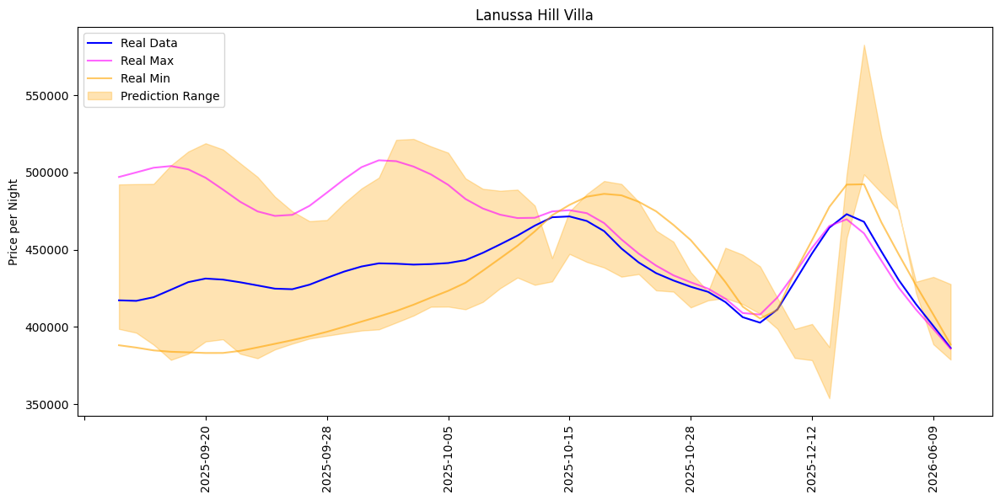

In [5]:
back_length = len(res_training['Lanussa Hill Villa']['real_data'])

plt.figure(figsize=(14,6))
plt.plot(res_training['Lanussa Hill Villa']['x_axis'][-back_length:],
         res_training['Lanussa Hill Villa']['real_data'],
         color='blue', label='Real Data')
# plt.plot(res_training['Lanussa Hill Villa']['x_axis'][-back_length:],
#          res_training['Lanussa Hill Villa']['baseline_pred'],
#          color='blue', label='Baseline Prediction', linestyle=':')

plt.plot(res_training['Lanussa Hill Villa']['x_axis'][-back_length:],
         res_training['Lanussa Hill Villa']['real_max'],
         color='magenta', alpha=0.6, label='Real Max')
# plt.plot(res_training['Lanussa Hill Villa']['x_axis'][-back_length:],
#          res_training['Lanussa Hill Villa']['max_pred'],
#          color='magenta', alpha=0.6, linestyle=':', label='Pred Max')

plt.plot(res_training['Lanussa Hill Villa']['x_axis'][-back_length:],
         res_training['Lanussa Hill Villa']['real_min'],
         color='orange', alpha=0.6, label='Real Min')
# plt.plot(res_training['Lanussa Hill Villa']['x_axis'][-back_length:],
#          res_training['Lanussa Hill Villa']['min_pred'],
#          color='orange', alpha=0.6, linestyle=':', label='Pred Min')
plt.fill_between(res_training['Lanussa Hill Villa']['x_axis'][-back_length:], 
                 res_training['Lanussa Hill Villa']['min_pred'], 
                 res_training['Lanussa Hill Villa']['max_pred'], color='orange', alpha=0.3,
            label='Prediction Range')
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
plt.title("Lanussa Hill Villa")
plt.ylabel("Price per Night")
plt.xticks(rotation=90)
plt.legend()
plt.show()

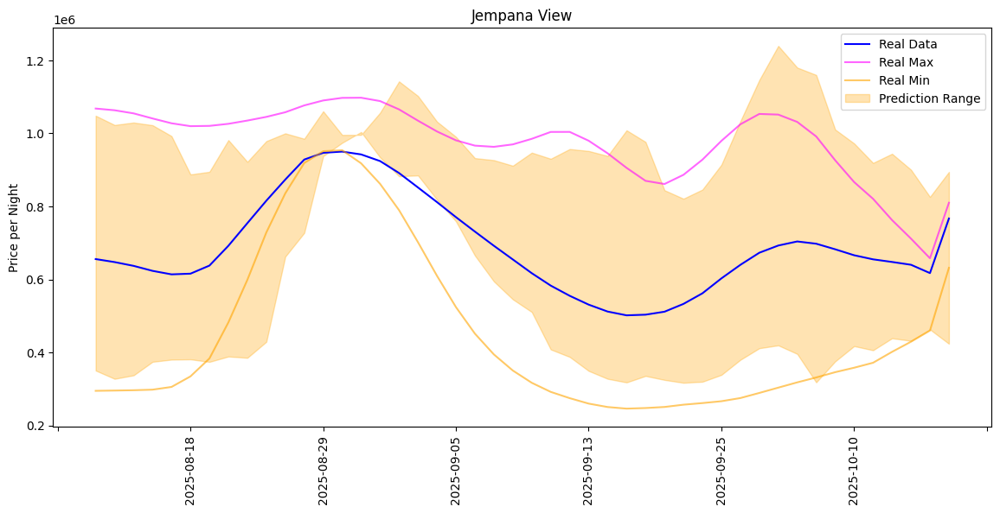

In [6]:
back_length = len(res_training['Jempana View']['real_data'])

plt.figure(figsize=(14,6))
plt.plot(res_training['Jempana View']['x_axis'][-back_length:],
         res_training['Jempana View']['real_data'],
         color='blue', label='Real Data')
# plt.plot(res_training['Jempana View']['x_axis'][-back_length:],
#          res_training['Jempana View']['baseline_pred'],
#          color='blue', label='Baseline Prediction', linestyle=':')

plt.plot(res_training['Jempana View']['x_axis'][-back_length:],
         res_training['Jempana View']['real_max'],
         color='magenta', alpha=0.6, label='Real Max')
# plt.plot(res_training['Jempana View']['x_axis'][-back_length:],
#          res_training['Jempana View']['max_pred'],
#          color='magenta', alpha=0.6, linestyle=':', label='Pred Max')

plt.plot(res_training['Jempana View']['x_axis'][-back_length:],
         res_training['Jempana View']['real_min'],
         color='orange', alpha=0.6, label='Real Min')
# plt.plot(res_training['Jempana View']['x_axis'][-back_length:],
#          res_training['Jempana View']['min_pred'],
#          color='orange', alpha=0.6, linestyle=':', label='Pred Min')

plt.fill_between(res_training['Jempana View']['x_axis'][-back_length:], 
                 res_training['Jempana View']['min_pred'], 
                 res_training['Jempana View']['max_pred'], color='orange', alpha=0.3,
            label='Prediction Range')
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
plt.title("Jempana View")
plt.ylabel("Price per Night")
plt.xticks(rotation=90)
plt.legend()
plt.show()

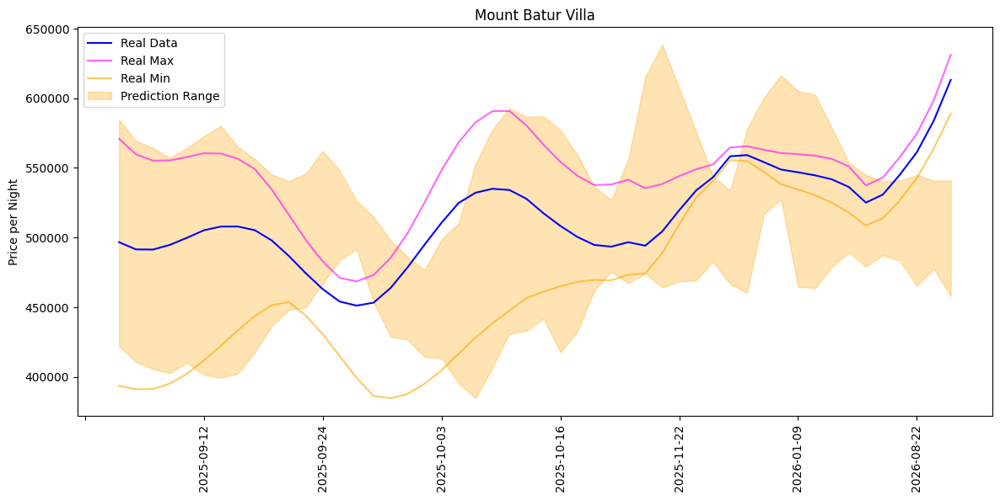

In [7]:
back_length = len(res_training['Mount Batur Villa']['real_data'])

plt.figure(figsize=(14,6))
plt.plot(res_training['Mount Batur Villa']['x_axis'][-back_length:],
         res_training['Mount Batur Villa']['real_data'],
         color='blue', label='Real Data')
# plt.plot(res_training['Mount Batur Villa']['x_axis'][-back_length:],
#          res_training['Mount Batur Villa']['baseline_pred'],
#          color='blue', label='Baseline Prediction', linestyle=':')

plt.plot(res_training['Mount Batur Villa']['x_axis'][-back_length:],
         res_training['Mount Batur Villa']['real_max'],
         color='magenta', alpha=0.6, label='Real Max')
# plt.plot(res_training['Mount Batur Villa']['x_axis'][-back_length:],
#          res_training['Mount Batur Villa']['max_pred'],
#          color='magenta', alpha=0.6, linestyle=':', label='Pred Max')

plt.plot(res_training['Mount Batur Villa']['x_axis'][-back_length:],
         res_training['Mount Batur Villa']['real_min'],
         color='orange', alpha=0.6, label='Real Min')
# plt.plot(res_training['Mount Batur Villa']['x_axis'][-back_length:],
#          res_training['Mount Batur Villa']['min_pred'],
#          color='orange', alpha=0.6, linestyle=':', label='Pred Min')

plt.fill_between(res_training['Mount Batur Villa']['x_axis'][-back_length:], 
                 res_training['Mount Batur Villa']['min_pred'], 
                 res_training['Mount Batur Villa']['max_pred'], color='orange', alpha=0.3,
            label='Prediction Range')
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
plt.title("Mount Batur Villa")
plt.ylabel("Price per Night")
plt.xticks(rotation=90)
plt.legend()
plt.show()

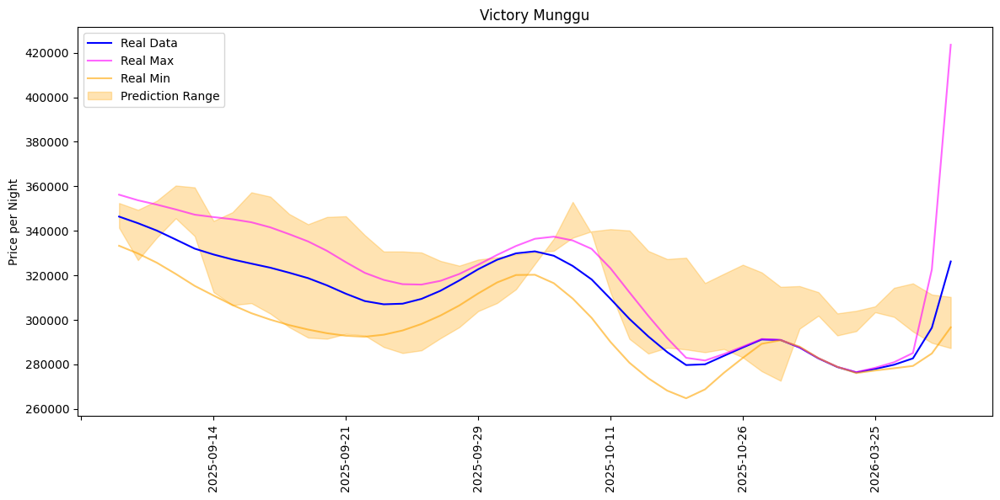

In [8]:
back_length = len(res_training['Victory Munggu']['real_data'])

plt.figure(figsize=(14,6))
plt.plot(res_training['Victory Munggu']['x_axis'][-back_length:],
         res_training['Victory Munggu']['real_data'],
         color='blue', label='Real Data')
# plt.plot(res_training['Victory Munggu']['x_axis'][-back_length:],
#          res_training['Victory Munggu']['baseline_pred'],
#          color='blue', label='Baseline Prediction', linestyle=':')

plt.plot(res_training['Victory Munggu']['x_axis'][-back_length:],
         res_training['Victory Munggu']['real_max'],
         color='magenta', alpha=0.6, label='Real Max')
# plt.plot(res_training['Victory Munggu']['x_axis'][-back_length:],
#          res_training['Victory Munggu']['max_pred'],
#          color='magenta', alpha=0.6, linestyle=':', label='Pred Max')

plt.plot(res_training['Victory Munggu']['x_axis'][-back_length:],
         res_training['Victory Munggu']['real_min'],
         color='orange', alpha=0.6, label='Real Min')
# plt.plot(res_training['Victory Munggu']['x_axis'][-back_length:],
#          res_training['Victory Munggu']['min_pred'],
#          color='orange', alpha=0.6, linestyle=':', label='Pred Min')

plt.fill_between(res_training['Victory Munggu']['x_axis'][-back_length:], 
                 res_training['Victory Munggu']['min_pred'], 
                 res_training['Victory Munggu']['max_pred'], color='orange', alpha=0.3,
            label='Prediction Range')
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
plt.xticks(rotation=90)
plt.title("Victory Munggu")
plt.ylabel("Price per Night")
plt.legend()
plt.show()

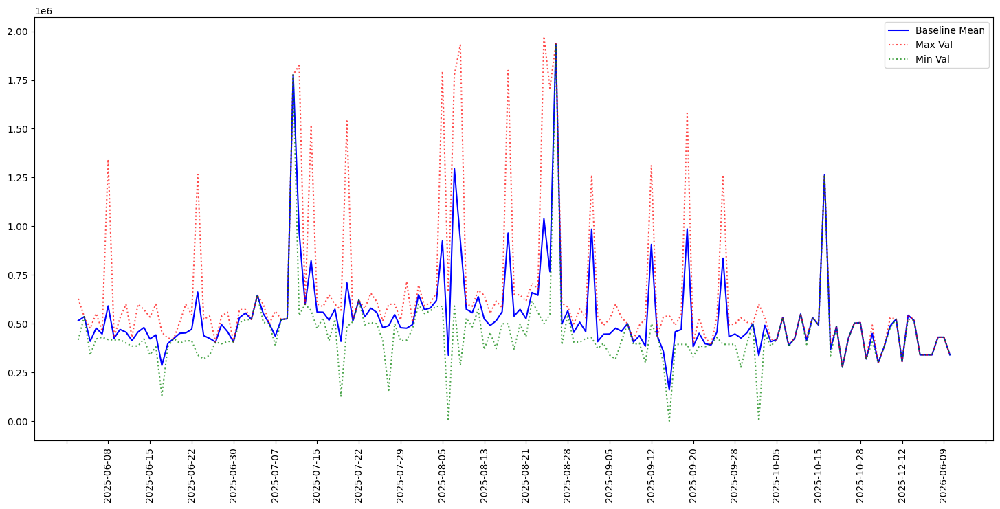

In [59]:
check = df[df['customer_name'] == 'Lanussa Hill Villa']
check2 = check.groupby('check_in')['price_per_night'].mean()
check2 = check2[check2.index > "2025-06-01"]
check2_mean = check2.resample('D').mean()
check2_mean = check2_mean.dropna()

check3 = check.groupby('check_in')['price_per_night'].max()
check3 = check3[check3.index > "2025-06-01"]
check3_max = check3.resample('D').max()
check3_max = check3_max.dropna()

check4 = check.groupby('check_in')['price_per_night'].min()
check4 = check4[check4.index > "2025-06-01"]
check4_min = check4.resample('D').min()
check4_min = check4_min.dropna()

date_axis = check2_mean.index.strftime("%Y-%m-%d").tolist()

plt.figure(figsize=(18,8))
plt.plot(date_axis, check2_mean, color='blue', label='Baseline Mean')
plt.plot(date_axis, check3_max, color='red', alpha=0.7, linestyle=':', label='Max Val')
plt.plot(date_axis, check4_min, color='green', alpha=0.7, linestyle=':', label='Min Val')
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
plt.legend()
plt.xticks(rotation=90)
plt.show()

In [5]:
# SIMULATION OF MOVING DAY AND RECORDING THE PICKUP RATE
# Start with while loop that ends untill the booking date range end
# Each day iterated, system will calculate several check in days forward
# Count the unique values and add it with previous memory, if the day not exist
# add the day into memory buffer

#####################################################################
######==================ORIGINAL ALGORITHM=====================######
#####################################################################

# import pandas as pd
# import numpy as np
# import seaborn as sns
# import matplotlib.pyplot as plt
# import json, os
# import datetime 
# from datetime import timedelta
# import warnings
# warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)
 
# check = df[df['customer_name'] == 'Victory Munggu']

# check['booking_date'] = pd.to_datetime(check['booking_date'])
# start_range = check['booking_date'].min()
# end_range = check['booking_date'].max()

# # end_range = start_range + timedelta(days=7)
# focus = check.sort_values(by='booking_date')
# memory_buffer = {}
# pu_rate = {}

# while start_range <= end_range:
#     offset_days = start_range + timedelta(days=1)
#     print(f"Booking date start from {offset_days}")
#     resampling = focus[(focus['booking_date'] >= offset_days) & 
#                        (focus['booking_date'] <= end_range)]
#     resampling['check_in'] = pd.to_datetime(resampling['check_in']).dt.strftime("%Y-%m-%d")
#     resampling = resampling.loc[(resampling['booking_date'] == offset_days),
#                                 ['check_in', 'price_per_night']]
#     count_occur = resampling.value_counts().reset_index()
#     print(count_occur)
#     print(offset_days.strftime("%Y-%m-%d"))
#     for i in range(len(count_occur)):
#         if count_occur.iloc[i, 0] not in memory_buffer:
#             day_start_record = int(count_occur.iloc[i, 2])
#             price_start_record = int(count_occur.iloc[i, 1])
#             memory_buffer[count_occur.iloc[i, 0]] = [int(count_occur.iloc[i, 2]), offset_days.strftime("%Y-%m-%d"),
#                                                      day_start_record, price_start_record]
#         else:
#             if memory_buffer[count_occur.iloc[i, 0]][0] == int(count_occur.iloc[i, 2]): pass
#             else:
#                 # delta = int(count_occur.iloc[i, 1]) - memory_buffer[count_occur.iloc[i, 0]]
#                 delta = int(count_occur.iloc[i, 2])
#                 memory_buffer[count_occur.iloc[i, 0]][0] = int(count_occur.iloc[i, 2]) + memory_buffer[count_occur.iloc[i, 0]][0]
#                 print(f"Day {count_occur.iloc[i, 0]} updated +{abs(delta)} bookings")
#         # print(count_occur.iloc[i, :])
#     print(memory_buffer, "\n")
#     start_range = start_range + timedelta(days=1)
# print(memory_buffer)


## SOURCE AND ALGORITHMS

---
### RNN MODELING, SLIDING WINDOWS AND MIXUP FUNCTION

In [4]:
forecast_horizon = 5  # number of steps ahead to predict
model = keras.models.Sequential([
    keras.layers.GRU(86, return_sequences=True, input_shape=[None, 1]),
    keras.layers.Dropout(0.2),
    keras.layers.GRU(64, return_sequences=True),
    keras.layers.Dropout(0.2),
    keras.layers.GRU(64),
    keras.layers.Dense(forecast_horizon)
  ])
optimizer = keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer='adam', loss='mean_absolute_error')

model_max = model
model_min = model

2025-10-16 01:05:14.169877: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
/usr/local/python/3.12.1/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [5]:
def create_sliding_windows(data, seq_length=20, horizon=5, step=1):
    X, y = [], []
    for i in range(0, len(data) - seq_length - horizon + 1, step):
        X.append(data[i:i+seq_length])
        y.append(data[i+seq_length:i+seq_length+horizon])
    return np.array(X), np.array(y)

def mixup(X, y, alpha=0.2, augment_factor=1.0):
    n_original = len(X)
    n_augmented = int(n_original * augment_factor)
    lam = np.random.beta(alpha, alpha, size=n_augmented)

    idx_a = np.random.randint(0, n_original, n_augmented)
    idx_b = np.random.randint(0, n_original, n_augmented)
    lam_X = lam.reshape(-1, 1, 1)
    lam_y = lam.reshape(-1, 1, 1)
    print(f"Total X before mixup : {X.shape}")
    print(f"Total y before mixup : {y.shape}")
    X_mix = lam_X * X[idx_a] + (1 - lam_X) * X[idx_b]
    y_mix = lam_y * y[idx_a] + (1 - lam_y) * y[idx_b]
    X_aug = np.vstack([X, X_mix])
    y_aug = np.vstack([y, y_mix])
    print(f"Total X after mixup : {X_aug.shape}")
    print(f"Total y after mixup : {y_aug.shape}")
    return X_aug, y_aug

---
### PICKUP RATE AND OCCUPANCY RATE CORRECTION

In [6]:
def pickup_rate_correction(check_df):
    check_df['booking_date'] = pd.to_datetime(check_df['booking_date'])
    check_df['check_in'] = pd.to_datetime(check_df['check_in'])

    daily_counts = check_df.groupby(['booking_date', 'check_in']).size().reset_index(name='daily_bookings')
    daily_counts['cumulative_bookings'] = daily_counts.groupby('check_in')['daily_bookings'].cumsum()
    daily_counts['daily_pickup'] = daily_counts.groupby('check_in')['cumulative_bookings'].diff()
    first_day = daily_counts.groupby('check_in')['cumulative_bookings'].transform('first')
    daily_counts['cumulative_pickup_rate'] = ((daily_counts['cumulative_bookings'] - first_day) / first_day.replace(0, pd.NA)) * 100
    daily_counts['lead_days'] = (daily_counts['check_in'] - daily_counts['booking_date']).dt.days
    return daily_counts

def continuous_occ_rate_correction(df_master, remaining_room, mem_buffer, mem_buffer_ckout, max_room_number):
    start_range = df_master['booking_date'].max()
    end_range = df_master['check_in'].max()
    mov_days = start_range

    rooms_left = remaining_room
    memory_buffer = {}
    memory_buffer_ckout = {}
    collected_date = []
    occ_rate = []
    while mov_days <= end_range:
        print(f"Booking date start from {mov_days}")
        resampling = df_master[(df_master['booking_date'] >= mov_days) &
                        (df_master['booking_date'] <= end_range)]
        resampling = resampling.loc[(resampling['booking_date'] == mov_days),
                                    ['check_in', 'check_out', 'booking_date', 'price_per_night']]
        count_occur = resampling.value_counts().reset_index()

        for i in range(len(count_occur)):
            ckin_record = count_occur.iloc[i, 0]
            ckout_record = count_occur.iloc[i, 1]
            delta = int(count_occur.iloc[i, 4])

            if ckin_record not in mem_buffer:
                mem_buffer[ckin_record] = [delta, ckin_record]
                print(f"added Check-in : {mem_buffer[ckin_record]}")
            else:
                mem_buffer[ckin_record][0] = delta + mem_buffer[ckin_record][0]
                print(f"Day {mov_days} updated +{abs(delta)} bookings")

            if ckout_record not in mem_buffer_ckout:
                mem_buffer_ckout[ckout_record] = [delta, ckout_record]
                print(f"added Check-out : {mem_buffer_ckout[ckout_record]}")
            else:
                mem_buffer_ckout[ckout_record][0] = delta + mem_buffer_ckout[ckout_record][0]
                print(f"Check out Day {mem_buffer_ckout[ckout_record][1]} updated +{abs(delta)} bookings")
        try:
            if mov_days == mem_buffer[mov_days][1]:
                rooms_left = rooms_left - mem_buffer[mov_days][0]
                print(f"Added rooms occupied : {mem_buffer[mov_days][0]}")

            print(f"read checkout date: {mem_buffer_ckout[mov_days][1]}")
            if mov_days == mem_buffer_ckout[mov_days][1]:
                rooms_left = rooms_left + mem_buffer_ckout[mov_days][0]
                print(f"Freed occupied rooms : {mem_buffer_ckout[mov_days][0]}")
        except Exception as e:
            pass
        print(f"Total rooms at day {mov_days} is {rooms_left}")
        occupancy_rate = (1 - (rooms_left / max_room_number)) * 100
        collected_date.append(mov_days)
        occ_rate.append(occupancy_rate)
        print(memory_buffer)
        print(memory_buffer_ckout, "\n")
        mov_days = mov_days + timedelta(days=1)

    continuous_occ_rate = pd.DataFrame({
        "Dates":collected_date,
        "Occupancy Rate":occ_rate
    })
    return continuous_occ_rate

def occupancy_rate_correction(occ, avail_room, avail_percentage):
    occ['booking_date'] = pd.to_datetime(occ['booking_date'])
    occ['check_in'] = pd.to_datetime(occ['check_in'])
    occ['check_out'] = pd.to_datetime(occ['check_out'])
    start_range = occ['booking_date'].min()
    end_range = occ['booking_date'].max()
    # end_range = start_range + timedelta(days=7)

    memory_buffer = {}
    memory_buffer_ckout = {}
    collected_date = []
    occ_rate = []
    focus = occ.sort_values(by='booking_date')
    offset_days = occ['booking_date'].min()
    rooms_left = avail_room

    while offset_days <= end_range:
        print(f"Booking date start from {offset_days}")
        resampling = focus[(focus['booking_date'] >= offset_days) &
                        (focus['booking_date'] <= end_range)]
        resampling = resampling.loc[(resampling['booking_date'] == offset_days),
                                    ['check_in', 'check_out', 'booking_date', 'price_per_night']]
        count_occur = resampling.value_counts().reset_index()

        for i in range(len(count_occur)):
            ckin_record = count_occur.iloc[i, 0]
            ckout_record = count_occur.iloc[i, 1]
            delta = int(count_occur.iloc[i, 4])
            # print(f"type of ckin_record is {type(ckin_record)}")
            # print(f"type of ckout_record is {type(ckout_record)}")
            # print(f"type of offset_days is {type(offset_days)}")

            if ckin_record not in memory_buffer:
                memory_buffer[ckin_record] = [delta, ckin_record]
                print(f"added Check-in : {memory_buffer[ckin_record]}")
            else:
                memory_buffer[ckin_record][0] = delta + memory_buffer[ckin_record][0]
                print(f"Day {offset_days} updated +{abs(delta)} bookings")

            if ckout_record not in memory_buffer_ckout:
                memory_buffer_ckout[ckout_record] = [delta, ckout_record]
                print(f"added Check-out : {memory_buffer_ckout[ckout_record]}")
            else:
                memory_buffer_ckout[ckout_record][0] = delta + memory_buffer_ckout[ckout_record][0]
                print(f"Check out Day {memory_buffer_ckout[ckout_record][1]} updated +{abs(delta)} bookings")
        try:
            if offset_days == memory_buffer[offset_days][1]:
                rooms_left = rooms_left - memory_buffer[offset_days][0]
                print(f"Added rooms occupied : {memory_buffer[offset_days][0]}")

            print(f"read checkout date: {memory_buffer_ckout[offset_days][1]}")
            if offset_days == memory_buffer_ckout[offset_days][1]:
                rooms_left = rooms_left + memory_buffer_ckout[offset_days][0]
                print(f"Freed occupied rooms : {memory_buffer_ckout[offset_days][0]}")
        except Exception as e:
            pass
        print(f"Total rooms at day {offset_days} is {rooms_left}")
        occupied_percentage = (1 - (rooms_left / avail_room)) * 100
        occupancy_rate = occupied_percentage - avail_percentage
        collected_date.append(offset_days)
        occ_rate.append(occupancy_rate)
        print(memory_buffer)
        print(memory_buffer_ckout, "\n")
        offset_days = offset_days + timedelta(days=1)

    summary_occ = pd.DataFrame({
        "Dates":collected_date,
        "Occupancy Rate":occ_rate
    })
    next_prediction = continuous_occ_rate_correction(occ, rooms_left, memory_buffer, memory_buffer_ckout, avail_room)
    summary_occ = pd.concat([summary_occ, next_prediction], ignore_index=True)
    return summary_occ

---
### SEASONAL CORRECTION FACTOR

In [7]:
def seasonal_correction(master_df, mn_date, mode="mean"):
    master_df['booking_date'] = pd.to_datetime(master_df['booking_date'])
    if mode == "mean":
        groupby_df = master_df.groupby('booking_date')['price_per_night'].mean()
        df_weekly = groupby_df.resample('W').mean()
    elif mode == "max":
        groupby_df = master_df.groupby('booking_date')['price_per_night'].max()
        df_weekly = groupby_df.resample('W').max()
    elif mode == "min":
        groupby_df = master_df.groupby('booking_date')['price_per_night'].min()
        df_weekly = groupby_df.resample('W').min()
    df_weekly = df_weekly.dropna()

    df_weekly_filtered = [i.strftime("%Y-%m-%d") for i in df_weekly.index if i.strftime("%Y-%m-%d") >= mn_date.strftime("%Y-%m-%d")]
    # print(f"mn_date is {mn_date.strftime('%Y-%m-%d')}")
    # print(f"df_weekly_filtered is : \n", df_weekly_filtered)
    # print(f"df_weekly_filtered shape is : ", len(df_weekly_filtered))
    stl = STL(df_weekly.values, period=52)  # 52 weeks in a year
    res = stl.fit()
    seasonal_pattern = res.seasonal[-len(df_weekly_filtered):]
    seasonal_df = pd.DataFrame({
        'Dates': df_weekly_filtered,
        'Seasonal_Pattern': seasonal_pattern
    })
    # Calculate percentage change compared to one week before
    seasonal_df['Pct_Change'] = seasonal_df['Seasonal_Pattern'].pct_change() * 100  # multiply by 100 to get percentage
    # Optional: round to 2 decimal places for readability
    seasonal_df['Pct_Change'] = seasonal_df['Pct_Change'].round(2)
    return seasonal_df

## EXECUTION AND DEBUGGING

---
### EXPLORATORY DATA ANALYSIS

/tmp/ipykernel_1907/564210546.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  monthly_counts = short_.groupby(['Month', 'PriceBin']).size().reset_index(name='count')
/tmp/ipykernel_1907/564210546.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_monthly = monthly_counts.groupby('PriceBin')['count'].mean()
/tmp/ipykernel_1907/564210546.py:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  yearly_counts = short_

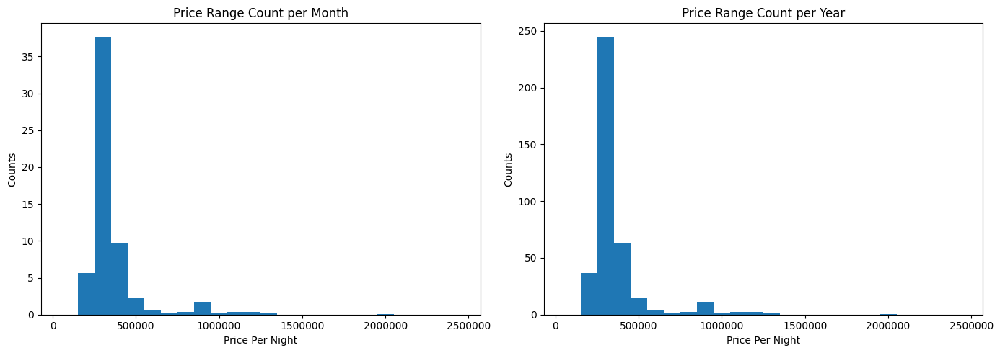

In [62]:
sub_df = df[df['customer_name'] == 'Victory Munggu']

sub_df['booking_date'] = pd.to_datetime(sub_df['booking_date'], format='mixed')
short_ = sub_df[['booking_date', 'check_in', 'check_out', 'price_per_night']]
short_['Year'] = short_['booking_date'].dt.year
short_['Month'] = short_['booking_date'].dt.to_period('M')

bin_size = 100000
price_min = 100000
price_max = 2500000
bins = np.arange(price_min, price_max + bin_size, bin_size)
short_['PriceBin'] = pd.cut(short_['price_per_night'], bins=bins, right=False)

# MONTHLY CALCULATION---------------------------------------------------------------------------------
monthly_counts = short_.groupby(['Month', 'PriceBin']).size().reset_index(name='count')
avg_monthly = monthly_counts.groupby('PriceBin')['count'].mean()

# YEARLY CALCULATION----------------------------------------------------------------------------------
yearly_counts = short_.groupby(['Year', 'PriceBin']).size().reset_index(name='count')
avg_yearly = yearly_counts.groupby('PriceBin')['count'].mean()

# PLOTTING--------------------------------------------------------------------------------------------
plt.figure(figsize=(14,5))

plt.subplot(121)
x = [interval.left for interval in avg_monthly.index]
plt.bar(x, avg_monthly.values, width=bin_size)
plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(500000))
plt.ticklabel_format(style='plain', axis='x')
plt.title('Price Range Count per Month')
plt.xlabel('Price Per Night')
plt.ylabel('Counts')

plt.subplot(122)
x = [interval.left for interval in avg_yearly.index]
plt.bar(x, avg_yearly.values, width=bin_size)
plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(500000))
plt.ticklabel_format(style='plain', axis='x')
plt.title('Price Range Count per Year')
plt.xlabel('Price Per Night')
plt.ylabel('Counts')

plt.tight_layout()
plt.show()

In [55]:
sub_df['check_in'] = pd.to_datetime(sub_df['check_in'])
date_list = sub_df.groupby('check_in').size()
# date_list = sub_df.groupby('check_in')['price_per_night'].mean()
ts = date_list.resample("D").max()
ts = ts.dropna()
for i in ts.index:
    print(i)

2024-10-05 00:00:00
2024-10-06 00:00:00
2024-10-07 00:00:00
2024-10-08 00:00:00
2024-10-09 00:00:00
2024-10-11 00:00:00
2024-10-12 00:00:00
2024-10-15 00:00:00
2024-10-16 00:00:00
2024-10-17 00:00:00
2024-10-18 00:00:00
2024-10-20 00:00:00
2024-10-24 00:00:00
2024-10-25 00:00:00
2024-10-26 00:00:00
2024-10-27 00:00:00
2024-10-28 00:00:00
2024-10-29 00:00:00
2024-10-30 00:00:00
2024-10-31 00:00:00
2024-11-01 00:00:00
2024-11-02 00:00:00
2024-11-05 00:00:00
2024-11-08 00:00:00
2024-11-09 00:00:00
2024-11-11 00:00:00
2024-11-12 00:00:00
2024-11-13 00:00:00
2024-11-14 00:00:00
2024-11-15 00:00:00
2024-11-16 00:00:00
2024-11-17 00:00:00
2024-11-21 00:00:00
2024-11-22 00:00:00
2024-11-23 00:00:00
2024-11-24 00:00:00
2024-11-25 00:00:00
2024-11-26 00:00:00
2024-11-27 00:00:00
2024-11-28 00:00:00
2024-11-29 00:00:00
2024-11-30 00:00:00
2024-12-01 00:00:00
2024-12-03 00:00:00
2024-12-05 00:00:00
2024-12-06 00:00:00
2024-12-07 00:00:00
2024-12-08 00:00:00
2024-12-10 00:00:00
2024-12-11 00:00:00


In [56]:
short_ = short_.sort_values(by='check_in')
zoom1 = short_[short_['check_in'] == "2025-09-27"]
zoom2 = short_[short_['check_in'] == "2025-10-13"]
zoom3 = short_[short_['check_in'] == "2025-10-26"]
zoom4 = short_[short_['check_in'] == "2026-04-18"]
print(zoom1)
print(zoom2)
print(zoom3)
print(zoom4)

     booking_date   check_in  check_out  price_per_night  Year    Month  \
2022   2025-09-26 2025-09-27 2025-10-02         362532.2  2025  2025-09   
2050   2025-08-06 2025-09-27 2025-09-30        1000000.0  2025  2025-08   
2054   2025-08-06 2025-09-27 2025-09-30         350000.0  2025  2025-08   
2053   2025-08-06 2025-09-27 2025-09-30         350000.0  2025  2025-08   
2052   2025-08-06 2025-09-27 2025-09-30         350000.0  2025  2025-08   
2051   2025-08-06 2025-09-27 2025-09-30         350000.0  2025  2025-08   
2049   2025-08-06 2025-09-27 2025-09-30         350000.0  2025  2025-08   
2019   2025-09-22 2025-09-27 2025-09-28         291815.0  2025  2025-09   

                PriceBin  
2022    [300000, 400000)  
2050  [1000000, 1100000)  
2054    [300000, 400000)  
2053    [300000, 400000)  
2052    [300000, 400000)  
2051    [300000, 400000)  
2049    [300000, 400000)  
2019    [200000, 300000)  
     booking_date   check_in  check_out  price_per_night  Year    Month  \
2089  

In [65]:
# DETECT IF THE PROPERTY MAY HAVE MORE THAN ONE ROOM
from diptest import diptest

dip, pval = diptest(short_['price_per_night'])
print(f"Hartigan's dip statistic: {dip}, p-value: {pval}")

if pval < 0.05:
    print("Likely bimodal or multimodal distribution.")
else:
    print("Likely unimodal distribution.")

# BUT I DON'T THINK THIS METHOD WILL ALWAYS GIVE YOU EXACTTRUE ANSWER, WHAT IF THE
# CALCULATIONS GIVE YOU FALSE ALARM OR GIVE YOU A VALUE THAT LIES EXACTLY AT EXTREME
# CASES (P-VALUE ~ 0.050093 OR P-VALUE ~ 0.0499956) TOO AMBIGUOUS

# WE CAN'T JUST USE RNN TO PREDICT THE MAX PATTERN, BECAUSE WHAT IF THE MODEL MISINTREPTRET
# THE PATTERNS AND IN FUTURE PREDICTION, THE MODEL MISCALCULATE THE EXTREME INCREMENT

# WE USE DETECTION SYSTEM INSTEAD, DETECT THE BOOKING ON THAT DAY (WHILE CALCULATING THE OCCUPANCY RATE)
# COLLECT THE PRICE, AND IF THERE'S LARGE DEVIATION BETWEEN MEAN PRICE AND MAX PRICE
# APPLY MULTIPLIER. THIS IS MORE ROBUST AND GUARANTEE THE INCREMENT WILL BE EXACTLY DONE ON THAT SAME DAY

Hartigan's dip statistic: 0.06080206985769728, p-value: 0.0
Likely bimodal or multimodal distribution.


In [ ]:
sandbox_df = sub_df.copy
sandbox_df['booking_date'] = pd.to_datetime(sandbox_df['booking_date'])
sandbox_df['check_in'] = pd.to_datetime(sandbox_df['check_in'])

daily_counts = sandbox_df.groupby(['booking_date', 'check_in']).size().reset_index(name='daily_bookings')
daily_counts['cumulative_bookings'] = daily_counts.groupby('check_in')['daily_bookings'].cumsum()
daily_counts['daily_pickup'] = daily_counts.groupby('check_in')['cumulative_bookings'].diff()
first_day = daily_counts.groupby('check_in')['cumulative_bookings'].transform('first')
daily_counts['cumulative_pickup_rate'] = ((daily_counts['cumulative_bookings'] - first_day) / first_day.replace(0, pd.NA)) * 100
daily_counts['lead_days'] = (daily_counts['check_in'] - daily_counts['booking_date']).dt.days

for i in df['Dates']: #DateTimeIndex
    aggregate_sub = sandbox_df.loc[(sandbox_df['Dates'] == i), :]
    mean_price = aggregate_sub['price_per_night'].mean()
    max_price = aggregate_sub['price_per_night'].max()
    delta_calc = ((max_price - mean_price) / mean_price)
    

In [ ]:
short_ = short_.sort_values(by='check_in')
zoom1 = short_[short_['check_in'] == "2025-09-27"]
zoom2 = short_[short_['check_in'] == "2025-10-13"]
zoom3 = short_[short_['check_in'] == "2025-10-26"]
zoom4 = short_[short_['check_in'] == "2026-04-18"]
print(zoom1)
print(zoom2)
print(zoom3)
print(zoom4)

     booking_date   check_in  check_out  price_per_night  Year    Month  \
2022   2025-09-26 2025-09-27 2025-10-02         362532.2  2025  2025-09   
2050   2025-08-06 2025-09-27 2025-09-30        1000000.0  2025  2025-08   
2054   2025-08-06 2025-09-27 2025-09-30         350000.0  2025  2025-08   
2053   2025-08-06 2025-09-27 2025-09-30         350000.0  2025  2025-08   
2052   2025-08-06 2025-09-27 2025-09-30         350000.0  2025  2025-08   
2051   2025-08-06 2025-09-27 2025-09-30         350000.0  2025  2025-08   
2049   2025-08-06 2025-09-27 2025-09-30         350000.0  2025  2025-08   
2019   2025-09-22 2025-09-27 2025-09-28         291815.0  2025  2025-09   

                PriceBin  
2022    [300000, 400000)  
2050  [1000000, 1100000)  
2054    [300000, 400000)  
2053    [300000, 400000)  
2052    [300000, 400000)  
2051    [300000, 400000)  
2049    [300000, 400000)  
2019    [200000, 300000)  
     booking_date   check_in  check_out  price_per_night  Year    Month  \
2089  

---
### BASELINE PREDICTION ADAPTATION

/tmp/ipykernel_1907/4252719812.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  occ['booking_date'] = pd.to_datetime(occ['booking_date'])
/tmp/ipykernel_1907/4252719812.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  occ['check_in'] = pd.to_datetime(occ['check_in'])
/tmp/ipykernel_1907/4252719812.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pan

Booking date start from 2024-10-05 00:00:00
added Check-in : [4, Timestamp('2024-10-05 00:00:00')]
added Check-out : [4, Timestamp('2024-10-06 00:00:00')]
Day 2024-10-05 00:00:00 updated +1 bookings
Check out Day 2024-10-06 00:00:00 updated +1 bookings
Day 2024-10-05 00:00:00 updated +1 bookings
Check out Day 2024-10-06 00:00:00 updated +1 bookings
added Check-in : [1, Timestamp('2024-10-07 00:00:00')]
added Check-out : [1, Timestamp('2024-10-09 00:00:00')]
Added rooms occupied : 6
Total rooms at day 2024-10-05 00:00:00 is 144
{Timestamp('2024-10-05 00:00:00'): [6, Timestamp('2024-10-05 00:00:00')], Timestamp('2024-10-07 00:00:00'): [1, Timestamp('2024-10-07 00:00:00')]}
{Timestamp('2024-10-06 00:00:00'): [6, Timestamp('2024-10-06 00:00:00')], Timestamp('2024-10-09 00:00:00'): [1, Timestamp('2024-10-09 00:00:00')]} 

Booking date start from 2024-10-06 00:00:00
added Check-in : [2, Timestamp('2024-10-08 00:00:00')]
Check out Day 2024-10-09 00:00:00 updated +2 bookings
added Check-in : [

/tmp/ipykernel_1907/146880197.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sub_df['check_in'] = pd.to_datetime(sub_df['check_in'])


ts is :  check_in
2024-10-05    343964.666667
2024-10-06    366049.333333
2024-10-07    349074.000000
2024-10-08    555458.000000
2024-10-09    361075.000000
                  ...      
2026-03-25    293377.333333
2026-04-18    902721.666667
2026-04-23    258639.461538
2026-06-01    258639.483333
2026-09-11    445833.333333
Name: price_per_night, Length: 315, dtype: float64
ts_monthly is :  check_in
2024-10-05    343964.666667
2024-10-06    366049.333333
2024-10-07    349074.000000
2024-10-08    555458.000000
2024-10-09    361075.000000
                  ...      
2026-03-25    293377.333333
2026-04-18    902721.666667
2026-04-23    258639.461538
2026-06-01    258639.483333
2026-09-11    445833.333333
Name: price_per_night, Length: 315, dtype: float64


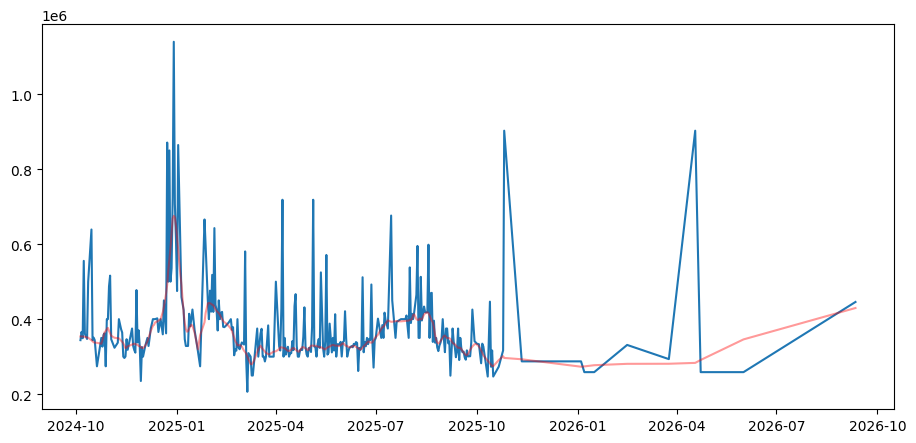

Raw data length is:  315
Total X data that will be used for this models : (296, 15, 1)
Total y data that will be used for this models : (296, 5, 1)
Data is sufficient enough, continuing!
Total X before mixup : (251, 15, 1)
Total y before mixup : (251, 5, 1)
Total X after mixup : (552, 15, 1)
Total y after mixup : (552, 5, 1)
Train: (470, 15, 1) (470, 5, 1)
Val:   (82, 15, 1) (82, 5, 1)
Test:  (45, 15, 1) (45, 5, 1)
Epoch 1/70


/tmp/ipykernel_1907/4252719812.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  check_df['booking_date'] = pd.to_datetime(check_df['booking_date'])
/tmp/ipykernel_1907/4252719812.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  check_df['check_in'] = pd.to_datetime(check_df['check_in'])


15/15 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step - loss: 0.1107 - val_loss: 0.0945
Epoch 2/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0739 - val_loss: 0.0760
Epoch 3/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0663 - val_loss: 0.0734
Epoch 4/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0617 - val_loss: 0.0667
Epoch 5/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0578 - val_loss: 0.0577
Epoch 6/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0574 - val_loss: 0.0598
Epoch 7/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0525 - val_loss: 0.0513
Epoch 8/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0504 - val_loss: 0.0459
Epoch 9/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0478 - val_loss: 0.0452
Epoch 10/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0466 - val_loss: 0.0426
Epoch 11/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0447 - val_loss: 0.0404
Epoch 12/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0434 - val_l

/tmp/ipykernel_1907/4252719812.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  check_df['booking_date'] = pd.to_datetime(check_df['booking_date'])
/tmp/ipykernel_1907/4252719812.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  check_df['check_in'] = pd.to_datetime(check_df['check_in'])


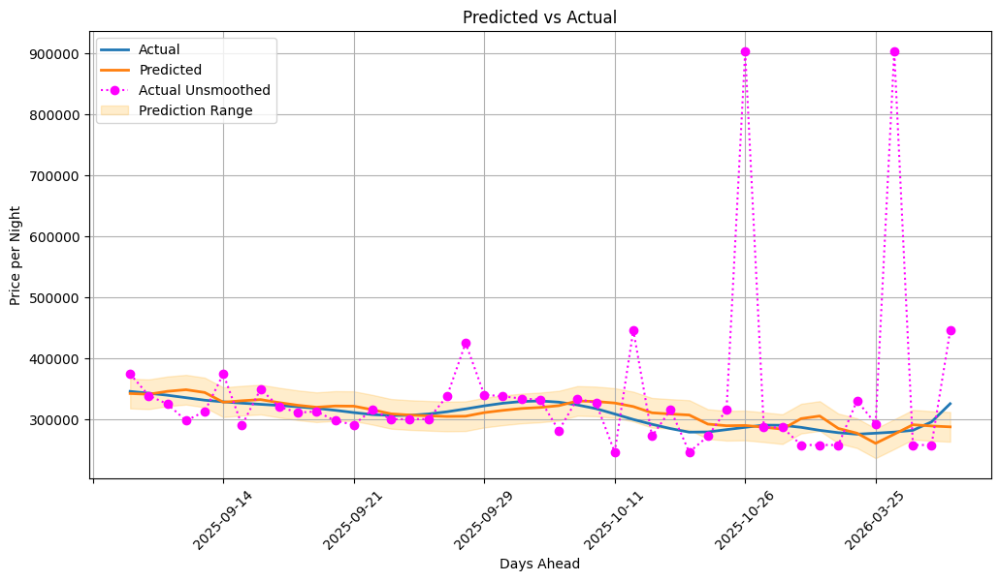

In [8]:
avail_room = 150
avail_percentage = 90
extra_steps = False
sub_df = df[df['customer_name'] == 'Victory Munggu']
occ_data_buffer = occupancy_rate_correction(sub_df, avail_room, avail_percentage)
X, y = [], []
sub_df['check_in'] = pd.to_datetime(sub_df['check_in'])
ts = sub_df.groupby('check_in')['price_per_night'].mean()
print("ts is : ", ts)
ts_monthly = ts.resample('D').mean()
ts_monthly = ts_monthly.dropna()
print("ts_monthly is : ", ts_monthly)

lowess = sm.nonparametric.lowess
lowess_value = []
lowess_value = lowess(ts_monthly.values, ts_monthly.index, frac=0.035)[:,1]
plt.figure(figsize=(11,5))
plt.plot(ts_monthly.index, ts_monthly.values)
plt.plot(ts_monthly.index, lowess_value, alpha=0.4, label='LOESS', color='red')
# plt.plot(ts_monthly.index, trend, alpha=0.4, label='Trendline', color='black')
plt.show()

scaler = MinMaxScaler()
lowess_scaled = scaler.fit_transform(lowess_value.reshape(-1, 1))
print("Raw data length is: ", len(lowess_scaled))

if len(lowess_scaled) >= 500:
    sequence_length = 20
else:
    sequence_length = 15
    extra_steps = True

for i in range(len(lowess_scaled) - sequence_length - forecast_horizon + 1):
    # Input window (20 timesteps)
    X.append(lowess_scaled[i : i + sequence_length])
    # Output window (next 10 timesteps)
    y.append(lowess_scaled[i + sequence_length : i + sequence_length + forecast_horizon])

X = np.array(X).reshape(-1, sequence_length, 1)  # (samples, 20, 1)
y = np.array(y).reshape(-1, forecast_horizon, 1)    # (samples, 10)
print(f"Total X data that will be used for this models : {X.shape}")
print(f"Total y data that will be used for this models : {y.shape}")

if X.shape[0] >= 90:
    print("Data is sufficient enough, continuing!")
    n_samples = len(X)
    train_size = int(n_samples * 0.85)

    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    if extra_steps == True:
        X_train, y_train = mixup(X_train, y_train, alpha=0.2, augment_factor=1.2)
        extra_steps = False

    # Now split train into 85% train, 15% validation
    n_train = len(X_train)
    val_size = int(n_train * 0.15)

    X_val, X_train = X_train[-val_size:], X_train[:-val_size]
    y_val, y_train = y_train[-val_size:], y_train[:-val_size]
    print("Train:", X_train.shape, y_train.shape)
    print("Val:  ", X_val.shape, y_val.shape)
    print("Test: ", X_test.shape, y_test.shape)

    ckin_data_buffer = pickup_rate_correction(sub_df)
    # print(f"===========TRAINING BATCH {j}===================")
    model.fit(X_train, y_train, epochs=70, validation_data=(X_val, y_val))
    model.evaluate(X_test, y_test)

    # ================FOR DEBUG ONLY=============================
    y_pred = model.predict(X_test)
    pred_scaled = scaler.inverse_transform(y_pred)
    y_test = np.squeeze(y_test, axis=-1)
    pred_test = scaler.inverse_transform(y_test)
    print("Prediction shape:", pred_scaled.shape)

    # Average across the 5 steps
    y_pred_mean = np.mean(pred_scaled, axis=1)
    y_test_mean = np.mean(pred_test, axis=1)

    residuals = y_test_mean - y_pred_mean
    std_dev = np.std(residuals)
    y_pred_upper = y_pred_mean + 2 * std_dev
    y_pred_lower = y_pred_mean - 2 * std_dev
    dates_buffer = ts_monthly.index[-len(y_pred_mean):].strftime("%Y-%m-%d")
    ckin_data_buffer = pickup_rate_correction(sub_df)

    try:
        rmsle = root_mean_squared_log_error(pred_test, pred_scaled)
        mae = mean_absolute_error(pred_test, pred_scaled)

        print(f'print rmsle: {100 * rmsle:.2f} %')
        print(f'print mae: {mae}')
    except Exception as e:
        print(f"[ERROR] Can't measure error: {e}")

    # Plot
    plt.figure(figsize=(12,6))
    plt.plot(y_test_mean, label="Actual", linewidth=2)
    plt.plot(y_pred_mean, label="Predicted", linewidth=2)
    plt.plot(ts_monthly.values[-len(y_pred_mean):], label="Actual Unsmoothed", linestyle=':', color='magenta', marker="o")
    plt.fill_between(dates_buffer, y_pred_lower, y_pred_upper, color='orange', alpha=0.2,
                label='Prediction Range')
    plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    # plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.xlabel("Days Ahead")
    plt.ylabel("Price per Night")
    plt.title("Predicted vs Actual")
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.show()

elif X.shape[0] < 90:
    print("Data is not sufficient enough")
    print("In the future, this will be place with Algorithm to fine tune factor parameters.")

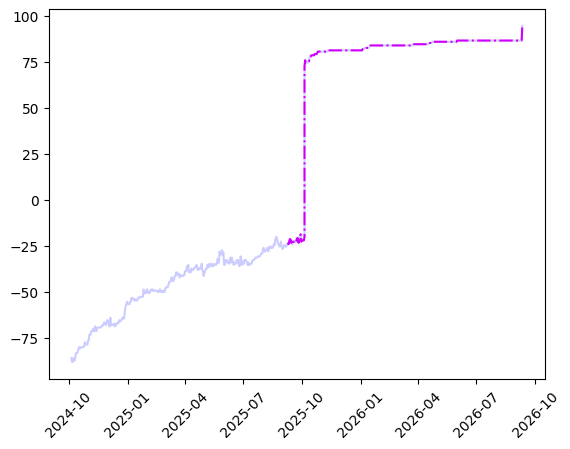

In [9]:
buffer_pred = occ_data_buffer[(occ_data_buffer['Dates'] >= ts_monthly.index[-len(y_pred_mean):].min()) &
                              (occ_data_buffer['Dates'] <= ts_monthly.index[-len(y_pred_mean):].max())]
aggregated_ckin = ckin_data_buffer.groupby('check_in')['cumulative_pickup_rate'].max()
aggregated_ckin.resample('D').max()

plt.plot(buffer_pred['Dates'], buffer_pred['Occupancy Rate'], color='magenta', linestyle="-.")
plt.plot(occ_data_buffer['Dates'], occ_data_buffer['Occupancy Rate'], color='blue', alpha=0.2)
plt.xticks(rotation=45)
plt.show()

In [10]:
import warnings
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)

pairing = zip(ts_monthly.index[-len(y_pred_mean):], y_pred_mean)
min_date = ts_monthly.index[-len(y_pred_mean):].min() - timedelta(days=365)
alpha = 0.04 # 0.03
beta =  -0.0001
gamma = -0.0003
caged = {}
for i in pairing:
    # print("date of interest is: ", i[0])
    corr_price = i[1] * (1 + (alpha * (aggregated_ckin.loc[i[0]] / 100)))
    if i[0] in buffer_pred['Dates'].values:
        corr_price =  corr_price * ((1 + (beta * buffer_pred.loc[(buffer_pred['Dates'] == i[0]), 'Occupancy Rate'])).tolist()[0])
    preview_seasonal = seasonal_correction(sub_df, min_date, "mean")
    lower_bound = preview_seasonal.loc[(preview_seasonal['Dates'] <= (i[0] - timedelta(days=365)).strftime('%Y-%m-%d')), :]
    # lower_bound = lower_bound[pd.notna(lower_bound['Pct_Change'])].reset_index(drop=True)
    lower_bound = lower_bound.fillna(0).reset_index(drop=True)
    lower_focus = lower_bound.iloc[-1:, :]
    if lower_focus['Pct_Change'].values.size > 0:
        corr_price = corr_price * (1 + (gamma * lower_focus['Pct_Change'].values)[0])
    else:
        corr_price = corr_price
    caged[i[0]] = corr_price
caged_series = pd.Series(caged)
caged_series

2025-09-09    357431.653204
2025-09-10    356219.221722
2025-09-11    375033.052440
2025-09-12    349863.912467
2025-09-13    400562.796090
2025-09-14    342607.727063
2025-09-15    371656.626516
2025-09-16    333746.041475
2025-09-17    355015.172444
2025-09-18    324379.002504
2025-09-19    321147.820054
2025-09-20    336098.533628
2025-09-21    322904.261067
2025-09-22    329773.521177
2025-09-23    322706.399773
2025-09-24    308294.264938
2025-09-25    307117.433517
2025-09-26    306073.728260
2025-09-27    310492.645800
2025-09-29    324709.131890
2025-09-30    316039.360817
2025-10-01    319100.480000
2025-10-03    320802.027687
2025-10-05    349543.800968
2025-10-06    380698.347525
2025-10-07    327398.596167
2025-10-11    324881.947385
2025-10-13    359562.315563
2025-10-14    348161.333221
2025-10-15    345884.584579
2025-10-16    344047.384156
2025-10-21    299679.307075
2025-10-25    296919.166459
2025-10-26    297340.655240
2025-11-11    298200.577282
2026-01-04    250203

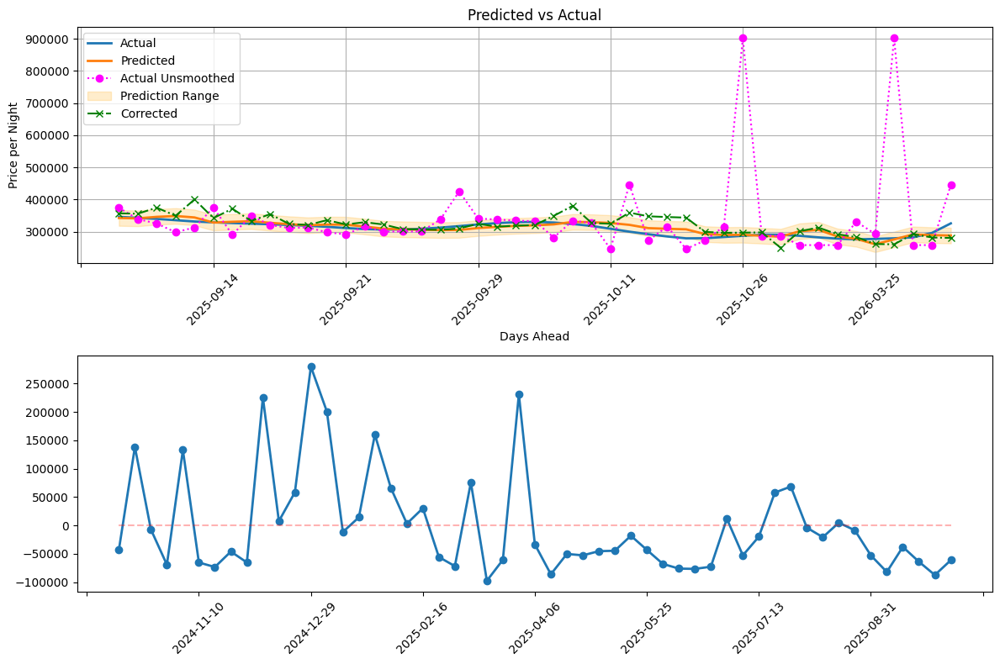

In [11]:
 # Plot
plt.figure(figsize=(12,8))
plt.subplot(211)
plt.plot(y_test_mean, label="Actual", linewidth=2)
plt.plot(y_pred_mean, label="Predicted", linewidth=2)
plt.plot(ts_monthly.values[-len(y_pred_mean):], label="Actual Unsmoothed", linestyle=':', color='magenta', marker="o")
plt.fill_between(dates_buffer, y_pred_lower, y_pred_upper, color='orange', alpha=0.2,
            label='Prediction Range')
plt.plot(caged_series.values, label="Corrected", color='green', linestyle='-.', marker='x')
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.xlabel("Days Ahead")
plt.ylabel("Price per Night")
plt.title("Predicted vs Actual")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)

plt.subplot(212)
plt.plot(preview_seasonal['Dates'], preview_seasonal['Seasonal_Pattern'], label="Seasonal trend", linewidth=2, marker='o')
plt.hlines(0.0, preview_seasonal['Dates'].min(), preview_seasonal['Dates'].max(), linestyle='--', alpha=0.3, color='red')
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

---
### MAXIMUM VALUE PREDICTION ADAPTATION

ts is :  check_in
2024-10-05    400000.000000
2024-10-06    400000.000000
2024-10-07    349074.000000
2024-10-08    900000.000000
2024-10-09    361075.000000
                  ...      
2026-03-25    293377.333333
2026-04-18    902721.666667
2026-04-23    258639.461538
2026-06-01    258639.483333
2026-09-11    950000.000000
Name: price_per_night, Length: 315, dtype: float64
ts_monthly is :  check_in
2024-10-05    400000.000000
2024-10-06    400000.000000
2024-10-07    349074.000000
2024-10-08    900000.000000
2024-10-09    361075.000000
                  ...      
2026-03-25    293377.333333
2026-04-18    902721.666667
2026-04-23    258639.461538
2026-06-01    258639.483333
2026-09-11    950000.000000
Name: price_per_night, Length: 315, dtype: float64


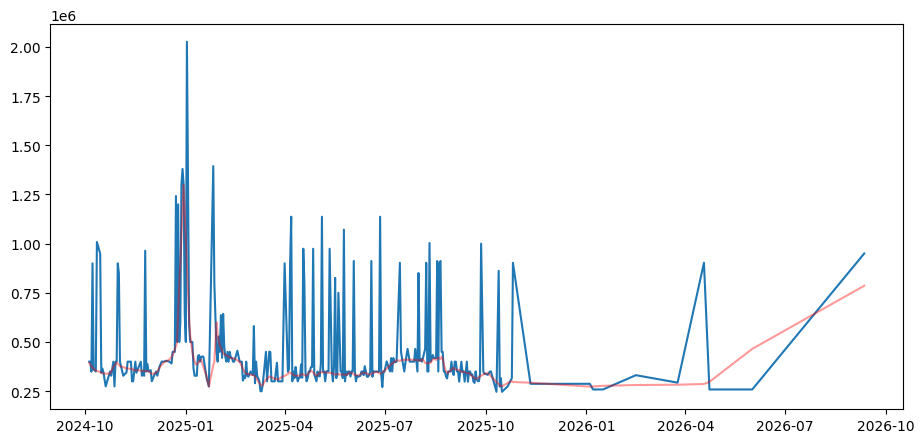

Raw data length is:  315
Total X data that will be used for this models : (296, 15, 1)
Total y data that will be used for this models : (296, 5, 1)
Data is sufficient enough, continuing!
Total X before mixup : (251, 15, 1)
Total y before mixup : (251, 5, 1)
Total X after mixup : (552, 15, 1)
Total y after mixup : (552, 5, 1)
Train: (470, 15, 1) (470, 5, 1)
Val:   (82, 15, 1) (82, 5, 1)
Test:  (45, 15, 1) (45, 5, 1)
Epoch 1/70
 5/15 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1332

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1221 - val_loss: 0.0887
Epoch 2/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0787 - val_loss: 0.0690
Epoch 3/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0694 - val_loss: 0.0669
Epoch 4/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0677 - val_loss: 0.0651
Epoch 5/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0670 - val_loss: 0.0648
Epoch 6/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0665 - val_loss: 0.0644
Epoch 7/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0665 - val_loss: 0.0644
Epoch 8/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0669 - val_loss: 0.0659
Epoch 9/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0668 - val_loss: 0.0643
Epoch 10/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0662 - val_loss: 0.0641
Epoch 11/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0660 - val_loss: 0.0638
Epoch 12/70
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0656 - val_l

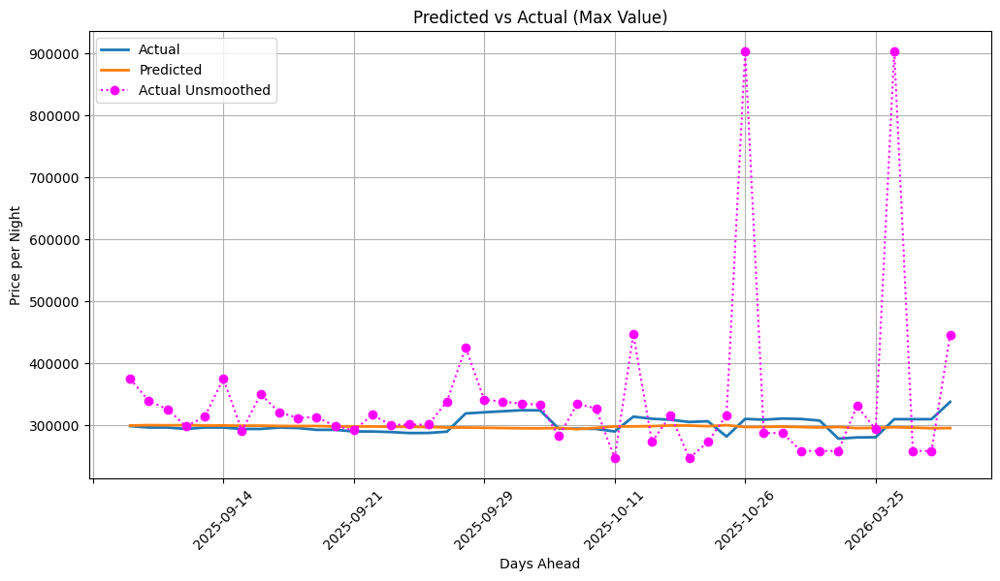

In [15]:
sub_df = df[df['customer_name'] == 'Victory Munggu']
X_max, y_max = [], []
sub_df['check_in'] = pd.to_datetime(sub_df['check_in'])
ts_max = sub_df.groupby('check_in')['price_per_night'].max()
print("ts is : ", ts_max)
ts_monthly_max = ts_max.resample('D').max()
ts_monthly_max = ts_monthly_max.dropna()
print("ts_monthly is : ", ts_monthly_max)

lowess_max = sm.nonparametric.lowess
lowess_value_max = []
lowess_value_max = lowess_max(ts_monthly_max.values, ts_monthly_max.index, frac=0.035)[:,1]
plt.figure(figsize=(11,5))
plt.plot(ts_monthly_max.index, ts_monthly_max.values)
plt.plot(ts_monthly_max.index, lowess_value_max, alpha=0.4, label='LOESS', color='red')
# plt.plot(ts_monthly.index, trend, alpha=0.4, label='Trendline', color='black')
plt.show()

scaler_max = MinMaxScaler()
# lowess_scaled_max = scaler_max.fit_transform(lowess_value_max.reshape(-1, 1))
lowess_scaled_max = scaler_max.fit_transform(ts_monthly_max.values.reshape(-1, 1))
print("Raw data length is: ", len(lowess_scaled_max))

if len(lowess_scaled_max) >= 500:
    sequence_length = 20
else:
    sequence_length = 15
    extra_steps = True

for i in range(len(lowess_scaled_max) - sequence_length - forecast_horizon + 1):
    # Input window (20 timesteps)
    X_max.append(lowess_scaled_max[i : i + sequence_length])
    # Output window (next 10 timesteps)
    y_max.append(lowess_scaled_max[i + sequence_length : i + sequence_length + forecast_horizon])

X_max = np.array(X_max).reshape(-1, sequence_length, 1)  # (samples, 20, 1)
y_max = np.array(y_max).reshape(-1, forecast_horizon, 1)    # (samples, 10)
print(f"Total X data that will be used for this models : {X_max.shape}")
print(f"Total y data that will be used for this models : {y_max.shape}")

if X_max.shape[0] >= 90:
    print("Data is sufficient enough, continuing!")
    n_samples = len(X_max)
    train_size = int(n_samples * 0.85)

    X_train, X_test = X_max[:train_size], X_max[train_size:]
    y_train, y_test = y_max[:train_size], y_max[train_size:]

    if extra_steps == True:
        X_train, y_train = mixup(X_train, y_train, alpha=0.2, augment_factor=1.2)
        extra_steps = False

    # Now split train into 85% train, 15% validation
    n_train = len(X_train)
    val_size = int(n_train * 0.15)

    X_val, X_train = X_train[-val_size:], X_train[:-val_size]
    y_val, y_train = y_train[-val_size:], y_train[:-val_size]
    print("Train:", X_train.shape, y_train.shape)
    print("Val:  ", X_val.shape, y_val.shape)
    print("Test: ", X_test.shape, y_test.shape)

    ckin_data_buffer = pickup_rate_correction(sub_df)
    # print(f"===========TRAINING BATCH {j}===================")
    model_max.fit(X_train, y_train, epochs=70, validation_data=(X_val, y_val))
    model_max.evaluate(X_test, y_test)

    # ================FOR DEBUG ONLY=============================
    y_pred = model_max.predict(X_test)
    pred_scaled = scaler.inverse_transform(y_pred)
    y_test = np.squeeze(y_test, axis=-1)
    pred_test = scaler.inverse_transform(y_test)
    print("Prediction shape:", pred_scaled.shape)

    # Average across the 5 steps
    y_pred_mean = np.mean(pred_scaled, axis=1)
    y_test_mean = np.mean(pred_test, axis=1)
    dates_buffer = ts_monthly.index[-len(y_pred_mean):].strftime("%Y-%m-%d")
    ckin_data_buffer = pickup_rate_correction(sub_df)

    try:
        rmsle = root_mean_squared_log_error(pred_test, pred_scaled)
        mae = mean_absolute_error(pred_test, pred_scaled)

        print(f'print rmsle: {100 * rmsle:.2f} %')
        print(f'print mae: {mae}')
    except Exception as e:
        print(f"[ERROR] Can't measure error: {e}")

    # Plot
    plt.figure(figsize=(12,6))
    plt.plot(dates_buffer, y_test_mean, label="Actual", linewidth=2)
    plt.plot(y_pred_mean, label="Predicted", linewidth=2)
    plt.plot(ts_monthly.values[-len(y_pred_mean):], label="Actual Unsmoothed", linestyle=':', color='magenta', marker="o")
    plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
    # plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.xlabel("Days Ahead")
    plt.ylabel("Price per Night")
    plt.title("Predicted vs Actual (Max Value)")
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.show()

elif X.shape[0] < 90:
    print("Data is not sufficient enough")
    print("In the future, this will be place with Algorithm to fine tune factor parameters.")

In [16]:
import warnings
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)

pairing = zip(ts_monthly.index[-len(y_pred_mean):], y_pred_mean)
min_date = ts_monthly.index[-len(y_pred_mean):].min() - timedelta(days=365)
alpha = 0.08 # 0.03
beta =  -0.005 # -0.005
gamma = -0.005 # -0.005
caged = {}
for i in pairing:
    # print("date of interest is: ", i[0])
    corr_price = i[1] * (1 + (alpha * (aggregated_ckin.loc[i[0]] / 100)))
    if i[0] in buffer_pred['Dates'].values:
        corr_price =  corr_price * ((1 + (beta * buffer_pred.loc[(buffer_pred['Dates'] == i[0]), 'Occupancy Rate'])).tolist()[0])
    preview_seasonal = seasonal_correction(sub_df, min_date, "max")
    lower_bound = preview_seasonal.loc[(preview_seasonal['Dates'] <= (i[0] - timedelta(days=365)).strftime('%Y-%m-%d')), :]
    # lower_bound = lower_bound[pd.notna(lower_bound['Pct_Change'])].reset_index(drop=True)
    lower_bound = lower_bound.fillna(0).reset_index(drop=True)
    lower_focus = lower_bound.iloc[-1:, :]
    if lower_focus['Pct_Change'].values.size > 0:
        corr_price = corr_price * (1 + (gamma * lower_focus['Pct_Change'].values)[0])
    else:
        corr_price = corr_price
    caged[i[0]] = corr_price
caged_series = pd.Series(caged)
caged_series

2025-09-09    361224.172688
2025-09-10    363081.360600
2025-09-11    387319.126792
2025-09-12    332181.389583
2025-09-13    437553.880500
2025-09-14    361405.826438
2025-09-15    413166.102283
2025-09-16    335204.905000
2025-09-17    385932.656608
2025-09-18    332484.440208
2025-09-19    332598.104583
2025-09-20    357100.754288
2025-09-21    331805.028542
2025-09-22    358318.694475
2025-09-23    355658.241150
2025-09-24    328218.772500
2025-09-25    330782.536250
2025-09-26    331057.538542
2025-09-27    334597.680083
2025-09-29    349408.941300
2025-09-30    328953.260000
2025-10-01    327576.193125
2025-10-03    327402.651563
2025-10-05    377157.607750
2025-10-06    240417.224850
2025-10-07    185332.847917
2025-10-11    185772.208646
2025-10-13    338820.292732
2025-10-14    337433.092694
2025-10-15    338589.362000
2025-10-16    336686.561866
2025-10-21    200917.197656
2025-10-25    200951.976122
2025-10-26    197815.865429
2025-11-11    415555.616275
2026-01-04    722795

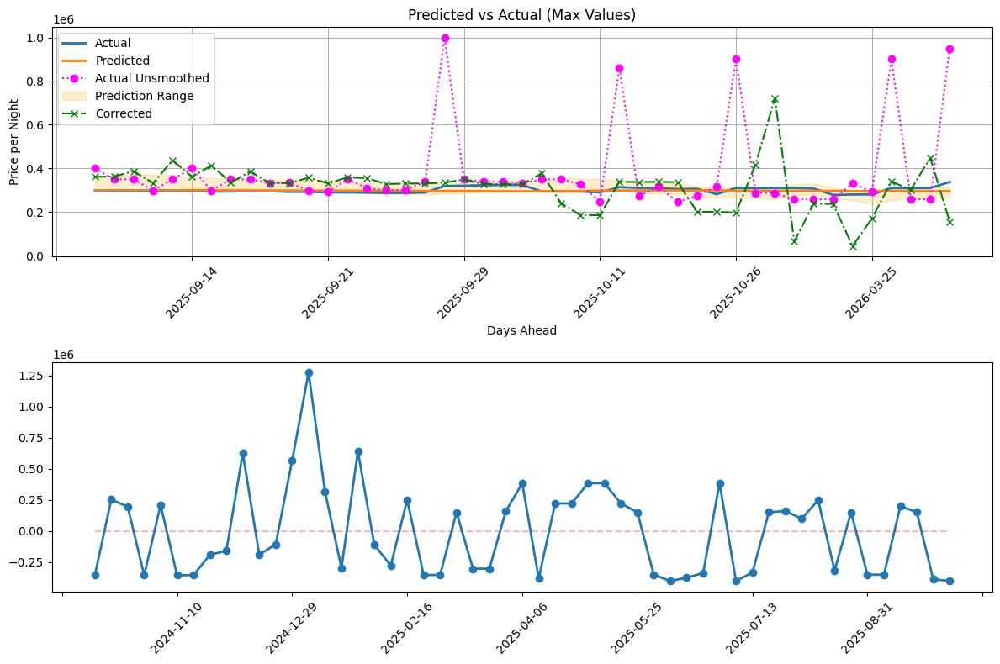

In [17]:
 # Plot
plt.figure(figsize=(12,8))
plt.subplot(211)
plt.plot(y_test_mean, label="Actual", linewidth=2)
plt.plot(y_pred_mean, label="Predicted", linewidth=2)
plt.plot(ts_monthly_max.values[-len(y_pred_mean):], label="Actual Unsmoothed", linestyle=':', color='magenta', marker="o")
plt.fill_between(dates_buffer, y_pred_lower, y_pred_upper, color='orange', alpha=0.2,
            label='Prediction Range')
plt.plot(caged_series.values, label="Corrected", color='green', linestyle='-.', marker='x')
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
# plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.xlabel("Days Ahead")
plt.ylabel("Price per Night")
plt.title("Predicted vs Actual (Max Values)")
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)

plt.subplot(212)
plt.plot(preview_seasonal['Dates'], preview_seasonal['Seasonal_Pattern'], label="Seasonal trend", linewidth=2, marker='o')
plt.hlines(0.0, preview_seasonal['Dates'].min(), preview_seasonal['Dates'].max(), linestyle='--', alpha=0.3, color='red')
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()